# CNN-based regression of drop impact parameters

## 1.0 Preparing the enviroment

In [85]:
#!pip install ipython-autotime
#!pip install opencv-python
#!pip install tensorflow_addons
%load_ext autotime

The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 565 µs (started: 2023-07-12 09:12:43 +02:00)


In [86]:
#Importing the necessary libraries
import math
import trimesh
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
import matplotlib as mpl
from glob import glob
from PIL import Image
import cv2
import json
from os import walk
from tqdm import tqdm
from datetime import datetime
import multiprocessing as mp
import re

time: 2.8 ms (started: 2023-07-12 09:12:43 +02:00)


In [87]:
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing as pp

time: 3.21 ms (started: 2023-07-12 09:12:43 +02:00)


In [88]:
import skimage.io
import skimage.color

time: 2.16 ms (started: 2023-07-12 09:12:43 +02:00)


In [89]:
# ML Algorithms to be used
import tensorflow as tf
from tensorflow import keras
from tensorflow_addons.metrics import RSquare
from keras import optimizers, models, layers, regularizers
from keras import backend as K
from keras.models import Sequential, Model
from keras.layers import Activation, Dense, Dropout, Conv2D, MaxPooling2D
from keras.layers import BatchNormalization, Input, Lambda, Flatten
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from keras.utils.np_utils import to_categorical

tf.__version__

'2.12.0'

time: 2.67 ms (started: 2023-07-12 09:12:43 +02:00)


## 2.0 Loading the data

In [90]:
# Define a helper function that takes a subdirectory name and returns the image and label
def process_subdirectory(path):
    size=512
    obj_path = path[0]
    subdirectory = path[1]
    image = None
    label = None
    readed = lambda image_name: np.asarray(Image.open(image_name).convert("RGB"))
    random_number=np.random.randint(0,36)*10
    # We found out that image '0304/220_0_00.png' is faulty, therefore it will be excluded
    while (subdirectory) == ('0304') and random_number == 220:
        random_number=np.random.randint(0,36)*10
    for i_image in os.listdir(obj_path+'/'+subdirectory):
        PATH = os.path.join(obj_path+'/'+subdirectory,i_image)
        if i_image==(str(random_number)+'_0_00.png'):        
            #read a random representation of each droplet
            img_loop = readed(PATH)
            # Resizing image if needed:
            # img_loop = cv2.resize(img_loop, (size,size))
            # Normalizing the colors
            #-----------------------------------------------------------------------
            # RGB (Red, Green, Blue) are 8 bit each and the range for each individual 
            # colour is 0-255 (2^8 = 256). By dividing by 255, the 0-255 range is converted to
            # a range between 0.0-1.0.
            #-----------------------------------------------------------------------
            image = np.array(img_loop)/255.
            label = subdirectory+'/'+i_image.replace('.png','')
            break
    return image, label

# Creating a function to read the images from the files:
def image_reader(obj_path):      
    images = []
    labels = []
    # Create a pool 
    pool = mp.Pool(mp.cpu_count())
    print(f"Using all {mp.cpu_count()} processor cores to parallelize task.")
    # Use imap to apply your function to each subdirectory and get an iterator of results
    subdirs = os.listdir(obj_path)
    results = tqdm(pool.imap(process_subdirectory, zip([obj_path] * len(subdirs), subdirs)), total = len(subdirs))
    # Iterate over the results and append them to the output lists
    for image, label in results:
        images.append(image)
        labels.append(label)
    return images, labels

time: 1.75 ms (started: 2023-07-12 09:12:43 +02:00)


In [91]:
# Reading the images
image_data, label_data = image_reader('/pfs/work7/workspace/scratch/oy0026-DDE2_droplet/RENDER/')
image_data = np.array(image_data)
label_data = np.array(label_data)
print(image_data.shape)

Using all 80 processor cores to parallelize task.


100%|██████████| 1479/1479 [00:42<00:00, 35.03it/s]


(1479, 512, 512, 3)
time: 55.9 s (started: 2023-07-12 09:12:43 +02:00)


In [92]:
print(label_data)

['0588/340_0_00' 'droplet0_387/340_0_00' 'droplet0_370/340_0_00' ...
 'droplet0_379/250_0_00' '0665/70_0_00' '0131/70_0_00']
time: 16.5 ms (started: 2023-07-12 09:13:39 +02:00)


In [93]:
# Sorting the data, as labels show that data is unsorted so far
sortedIndices = np.argsort(label_data)
sorted_labels = label_data[sortedIndices]
sorted_images = image_data[sortedIndices]

time: 3.52 s (started: 2023-07-12 09:13:39 +02:00)


In [94]:
print(sorted_labels)

['0001/300_0_00' '0002/140_0_00' '0003/50_0_00' ... 'droplet0_97/100_0_00'
 'droplet0_98/260_0_00' 'droplet0_99/50_0_00']
time: 620 µs (started: 2023-07-12 09:13:43 +02:00)


In [95]:
#Read y_data from json file (contains data extracted from .obj files with trimesh script)
def read_json_data(filename):
    f = open(filename)
    data = json.load(f)
    return data

time: 12.3 ms (started: 2023-07-12 09:13:43 +02:00)


In [96]:
# For access over Visual Studio code, one has to move the directory to the git folder.
if os.getcwd().split("/")[-1] != "dde2_project":
    os.chdir("./dde2_project")

time: 2.87 ms (started: 2023-07-12 09:13:43 +02:00)


In [97]:
labeled_y_data = read_json_data('parameter_data.json')
y_data=[]
for key, value in labeled_y_data.items(): # keys are already sorted in json 
    y_data.append(value)
y_data=np.array(y_data)
print(y_data.shape)

(1479, 23)
time: 50.8 ms (started: 2023-07-12 09:13:43 +02:00)


In [98]:
print(y_data[0]) #Shape is 23
# volume, area, 3x centroid, contact angle, shadowed area, perimeter, w, skewness, kurtosis, max_pit_height, max_peak_height, aspect_ratio, theta, point_aspect_ratio, hull_ratio
# moments (2[:,0],2[:,1],3[:,0],3[:,1],4[:,0],4[:,1])

[-6.10399648e+05  3.48113614e+04  2.16657502e-06  5.17007097e+01
 -2.54537324e-06  1.20883888e+01  5.61419787e+02  9.03778853e+01
  5.53755995e-01  1.42147702e+00  2.13768757e+00  8.50517340e-01
  7.33344768e-01  1.05216580e+00  7.51757096e-03  1.12462130e+00
  9.62688720e-01  1.13397719e+02  6.76163356e+01 -1.44565138e-04
 -1.01359980e-04  1.68057889e+04  7.79205412e+03]
time: 8.15 ms (started: 2023-07-12 09:13:43 +02:00)


## 3.0 Data Exploration and Feature Engineering

In [99]:
#for easier readability put y_data in Pandas Dataframe and add feature names
y_data=pd.DataFrame(y_data)
y_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1479 entries, 0 to 1478
Data columns (total 23 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       1479 non-null   float64
 1   1       1479 non-null   float64
 2   2       1479 non-null   float64
 3   3       1479 non-null   float64
 4   4       1479 non-null   float64
 5   5       1325 non-null   float64
 6   6       1325 non-null   float64
 7   7       1325 non-null   float64
 8   8       1325 non-null   float64
 9   9       1325 non-null   float64
 10  10      1325 non-null   float64
 11  11      1325 non-null   float64
 12  12      1325 non-null   float64
 13  13      1325 non-null   float64
 14  14      1325 non-null   float64
 15  15      1325 non-null   float64
 16  16      1325 non-null   float64
 17  17      1325 non-null   float64
 18  18      1325 non-null   float64
 19  19      1325 non-null   float64
 20  20      1325 non-null   float64
 21  21      1325 non-null   float64
 22  

In [100]:
y_data.rename(columns = {0:'Volume', 1:'Area', 2:'x centroid' , 3:'y centroid' , 4:'z centroid', 5:'Contact Angle', 6:'shadowed area', 7:'perimeter', 8:'w', 9:'skewness',
                         10:'kurtosis', 11:'max pit height', 12:'max peak height', 13:'aspect ratio', 14:'theta', 15:'point aspect ratio', 16:'hull ratio',
                         17:'moment 2 x', 18:'moment 2 z', 19:'moment 3 x', 20:'moment 3 z', 21:'moment 4 x', 22:'moment 4 z'}, inplace = True)

time: 6.2 ms (started: 2023-07-12 09:13:43 +02:00)


In [101]:
y_data['compactness']=y_data['perimeter']/y_data['shadowed area']

time: 68 ms (started: 2023-07-12 09:13:43 +02:00)


In [102]:
y_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1479 entries, 0 to 1478
Data columns (total 24 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Volume              1479 non-null   float64
 1   Area                1479 non-null   float64
 2   x centroid          1479 non-null   float64
 3   y centroid          1479 non-null   float64
 4   z centroid          1479 non-null   float64
 5   Contact Angle       1325 non-null   float64
 6   shadowed area       1325 non-null   float64
 7   perimeter           1325 non-null   float64
 8   w                   1325 non-null   float64
 9   skewness            1325 non-null   float64
 10  kurtosis            1325 non-null   float64
 11  max pit height      1325 non-null   float64
 12  max peak height     1325 non-null   float64
 13  aspect ratio        1325 non-null   float64
 14  theta               1325 non-null   float64
 15  point aspect ratio  1325 non-null   float64
 16  hull r

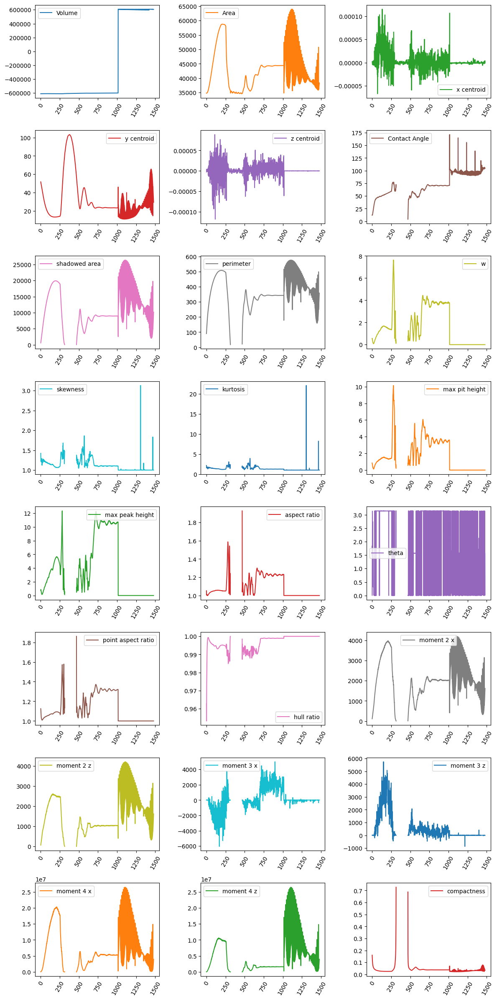

time: 5.89 s (started: 2023-07-12 09:13:43 +02:00)


In [103]:
fig, axes = plt.subplots(8, 3, figsize=(12, 24), tight_layout=True)
y_data.iloc[:,:24].plot(ax = axes, subplots = True, rot = 60)
plt.show()

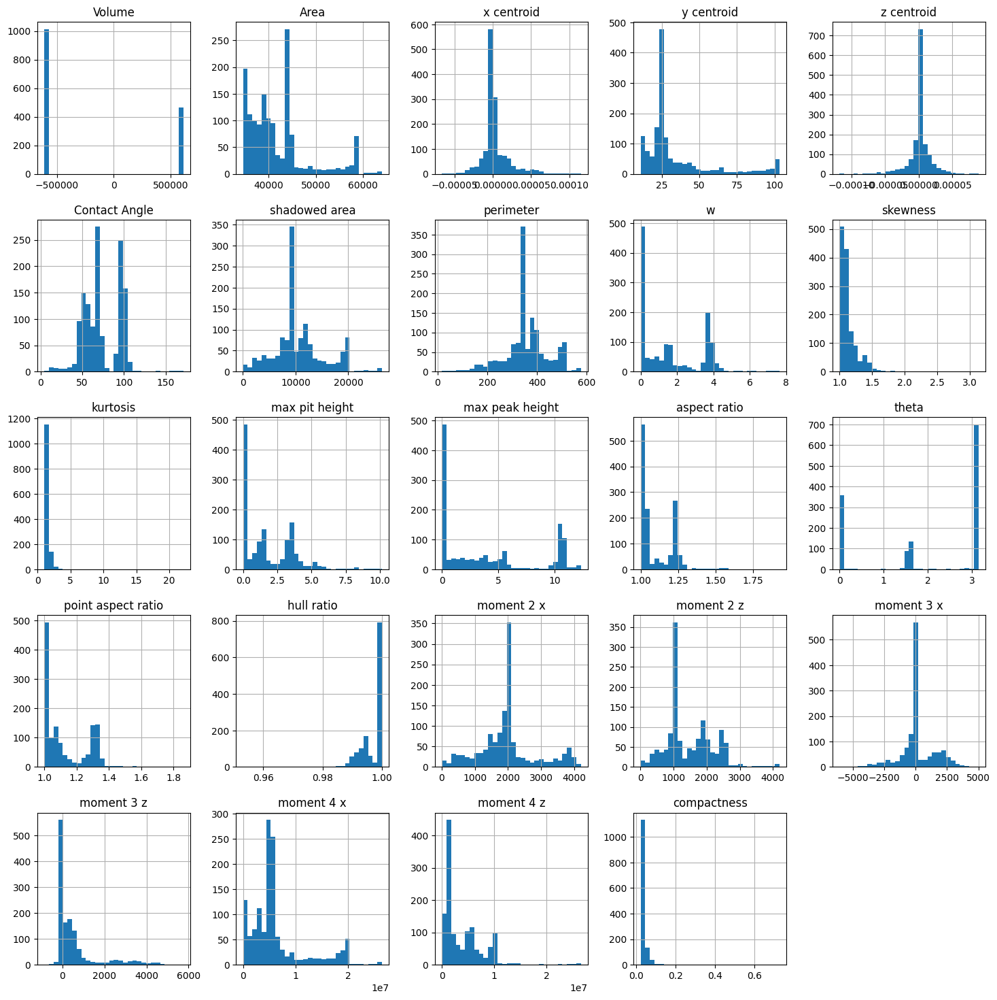

time: 3.19 s (started: 2023-07-12 09:13:49 +02:00)


In [104]:
y_data.hist(bins=30, figsize=(18,18))
plt.show()

> Coordinate axes are wrong, y axis should be z axis
> From the x and z coordinates we can see, that the area of the droplets in sum seems to be rotationally symmetrical
> Therefore the x and z coordinates do not contain relevant information for the 3D reconstruction

In [105]:
# As we have seen above some volumes are negative, for the moment the absolute value is being taken 
# Reason for negative volume should be investigated!
y_data['Volume'] = np.abs(y_data['Volume'])
y_data['Volume'].value_counts()

610399.648118    1
599985.966817    1
599901.252631    1
599910.416775    1
599919.652702    1
                ..
603313.023031    1
603335.009368    1
603360.952753    1
603389.153670    1
605039.659185    1
Name: Volume, Length: 1479, dtype: int64

time: 23.5 ms (started: 2023-07-12 09:13:52 +02:00)


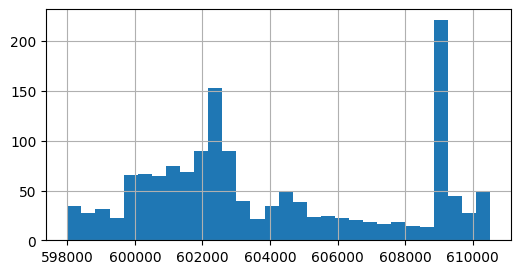

time: 124 ms (started: 2023-07-12 09:13:53 +02:00)


In [106]:
y_data['Volume'].hist(bins=30, figsize=(6,3))
plt.show()

In [107]:
# check the uniqueness of the dataset
distinctCounter = y_data.apply(lambda x: len(x.unique()))
print(distinctCounter)

Volume                1479
Area                  1479
x centroid            1479
y centroid            1479
z centroid            1479
Contact Angle         1326
shadowed area         1326
perimeter             1326
w                     1326
skewness              1326
kurtosis              1326
max pit height        1326
max peak height       1326
aspect ratio          1326
theta                 1326
point aspect ratio    1326
hull ratio            1040
moment 2 x            1326
moment 2 z            1326
moment 3 x            1326
moment 3 z            1326
moment 4 x            1326
moment 4 z            1326
compactness           1326
dtype: int64
time: 14.6 ms (started: 2023-07-12 09:13:53 +02:00)


In [108]:
y_data.isna().sum()

Volume                  0
Area                    0
x centroid              0
y centroid              0
z centroid              0
Contact Angle         154
shadowed area         154
perimeter             154
w                     154
skewness              154
kurtosis              154
max pit height        154
max peak height       154
aspect ratio          154
theta                 154
point aspect ratio    154
hull ratio            154
moment 2 x            154
moment 2 z            154
moment 3 x            154
moment 3 z            154
moment 4 x            154
moment 4 z            154
compactness           154
dtype: int64

time: 2.79 ms (started: 2023-07-12 09:13:53 +02:00)


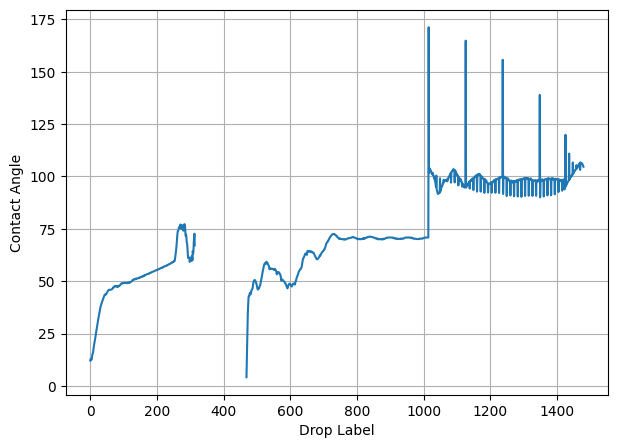

time: 127 ms (started: 2023-07-12 09:13:53 +02:00)


In [109]:
# As there are some NaN values in the Contact Angle let's have a closer look at that feature
mpl.rcParams['figure.figsize'] = [7.0, 5.0]
plt.grid(True)
plt.plot(np.linspace(0,len(y_data),len(y_data)), y_data["Contact Angle"])
plt.xlabel('Drop Label')
plt.ylabel('Contact Angle')
plt.show()

> We also found out that due to the normal vectors of the droplet mesh pointing into the opposite direction for one of the simulations, the calculation of the angles of this simulation has to be corrected by 180°.

In [110]:
# Filtering the labels using a pattern looking for all labels leading with four numbers:
labels_first_simulation = [s for s in sorted_labels if re.match(r"^\d{4}", s)]
# Correcting the angles for those values
y_data["Contact Angle"][0:len(labels_first_simulation)] = 180 - y_data["Contact Angle"][0:len(labels_first_simulation)]

time: 3.12 ms (started: 2023-07-12 09:13:53 +02:00)


Int64Index([314, 315, 316, 317, 318, 319, 320, 321, 322, 323,
            ...
            458, 459, 460, 461, 462, 463, 464, 465, 466, 467],
           dtype='int64', length=154)


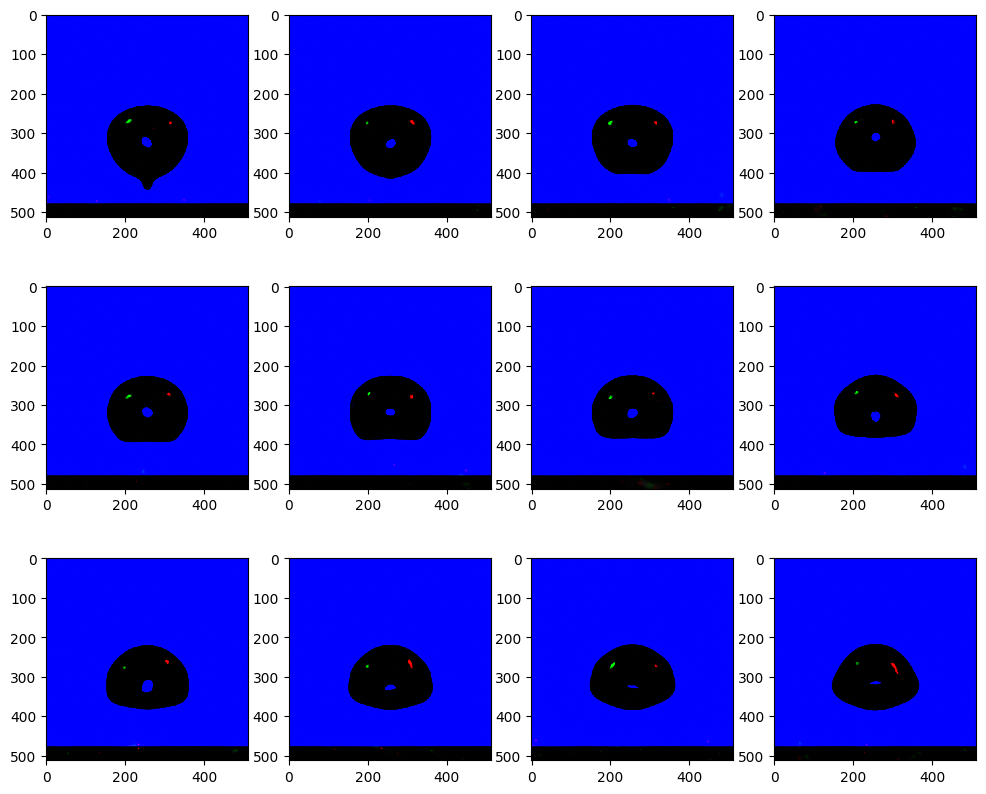

time: 1.21 s (started: 2023-07-12 09:13:53 +02:00)


In [111]:
# A closer look some of the images which have contact angle nan
mpl.rcParams['figure.figsize'] = [12.0, 12.0]
nan_angle_bool = y_data['Contact Angle'].isna()
nan_angle_indices = y_data[nan_angle_bool].index
#print(len(nan_angle_indices))
nan_angle_filenames = sorted_labels[y_data['Contact Angle'].isna()]
print((nan_angle_indices))
fig=plt.figure(figsize=(12, 10))
for i in range(1, 12 +1):
    ax = fig.add_subplot(3, 4, i)
    plt.imshow(sorted_images[nan_angle_indices[i]], interpolation='nearest')
plt.show()
mpl.rcParams['figure.figsize'] = [7.0, 5.0]

In [112]:
# We see that a contact angle NaN appears if the droplet has no contact to the ground, therefore for the moment 
# let's encode the NaN values as -1
y_data["Contact Angle"][nan_angle_indices]=-1
y_data["Contact Angle"].value_counts()

-1.000000      154
 167.911611      1
 95.935493       1
 91.616875       1
 92.068249       1
              ... 
 131.645911      1
 131.921561      1
 132.251561      1
 133.008676      1
 104.645713      1
Name: Contact Angle, Length: 1326, dtype: int64

time: 4.62 ms (started: 2023-07-12 09:13:54 +02:00)


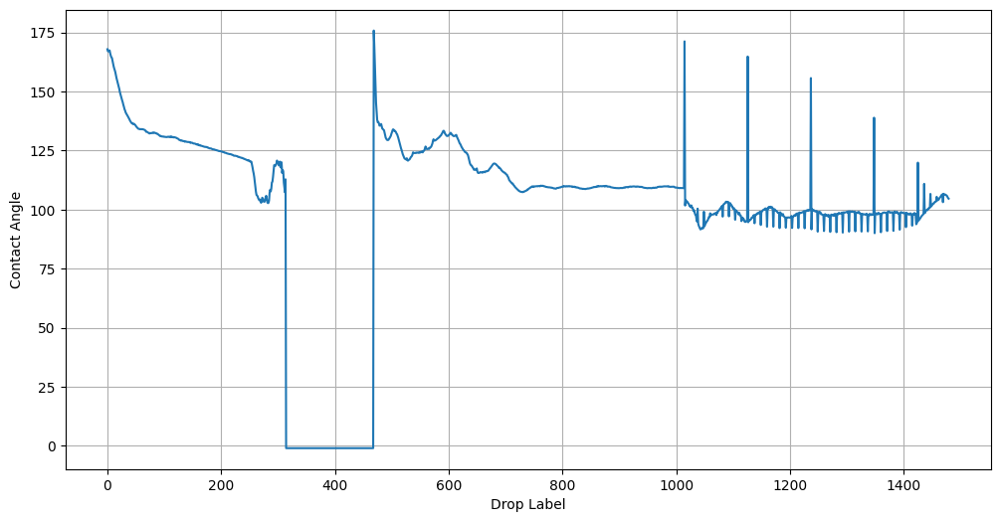

time: 143 ms (started: 2023-07-12 09:13:54 +02:00)


In [113]:
#Lets see the updated plot:
plt.rcParams["figure.figsize"] = (12,6)
plt.grid(True)
plt.plot(np.linspace(0,len(y_data),len(y_data)), y_data["Contact Angle"])
plt.xlabel('Drop Label')
plt.ylabel('Contact Angle')
plt.show()

In [114]:
# "repair" other nan values
# nan values always occure, when the droplet does not touch the ground
# find nan positions
nan_ind_z = y_data['z centroid'].isna()
nan_ind_shadow = y_data['shadowed area'].isna()
nan_ind_perimeter = y_data['perimeter'].isna()
nan_ind_w = y_data['w'].isna()
nan_ind_skewness = y_data['skewness'].isna()
nan_ind_kurtosis = y_data['kurtosis'].isna()
nan_ind_pit = y_data['max pit height'].isna()
nan_ind_peak = y_data['max peak height'].isna()
nan_ind_aspect = y_data['aspect ratio'].isna()
nan_ind_theta = y_data['theta'].isna()
nan_ind_point = y_data['point aspect ratio'].isna()
nan_ind_hull = y_data['hull ratio'].isna()
nan_ind_2x = y_data['moment 2 x'].isna()
nan_ind_2z = y_data['moment 2 z'].isna()
nan_ind_3x = y_data['moment 3 x'].isna()
nan_ind_3z = y_data['moment 3 z'].isna()
nan_ind_4x = y_data['moment 4 x'].isna()
nan_ind_4z = y_data['moment 4 z'].isna()

# set new value
y_data["z centroid"][nan_ind_z]=-1
y_data["shadowed area"][nan_ind_shadow]=0
y_data["perimeter"][nan_ind_perimeter]=0
y_data["w"][nan_ind_w]=-1
y_data["skewness"][nan_ind_skewness]=0
y_data["kurtosis"][nan_ind_kurtosis]=0
y_data["max pit height"][nan_ind_pit]=-1
y_data["max peak height"][nan_ind_peak]=-1
y_data["aspect ratio"][nan_ind_aspect]=0
y_data["theta"][nan_ind_theta]=-1
y_data["point aspect ratio"][nan_ind_point]=0
y_data["hull ratio"][nan_ind_hull]=0
y_data["moment 2 x"][nan_ind_2x]=-1
y_data["moment 2 z"][nan_ind_2z]=-1
y_data["moment 3 x"][nan_ind_3x]=-4000
y_data["moment 3 z"][nan_ind_3z]=-4000
y_data["moment 4 x"][nan_ind_4x]=-1
y_data["moment 4 z"][nan_ind_4z]=-1
y_data["compactness"][nan_ind_4z]=0

y_data.isna().sum()

Volume                0
Area                  0
x centroid            0
y centroid            0
z centroid            0
Contact Angle         0
shadowed area         0
perimeter             0
w                     0
skewness              0
kurtosis              0
max pit height        0
max peak height       0
aspect ratio          0
theta                 0
point aspect ratio    0
hull ratio            0
moment 2 x            0
moment 2 z            0
moment 3 x            0
moment 3 z            0
moment 4 x            0
moment 4 z            0
compactness           0
dtype: int64

time: 18.1 ms (started: 2023-07-12 09:13:54 +02:00)


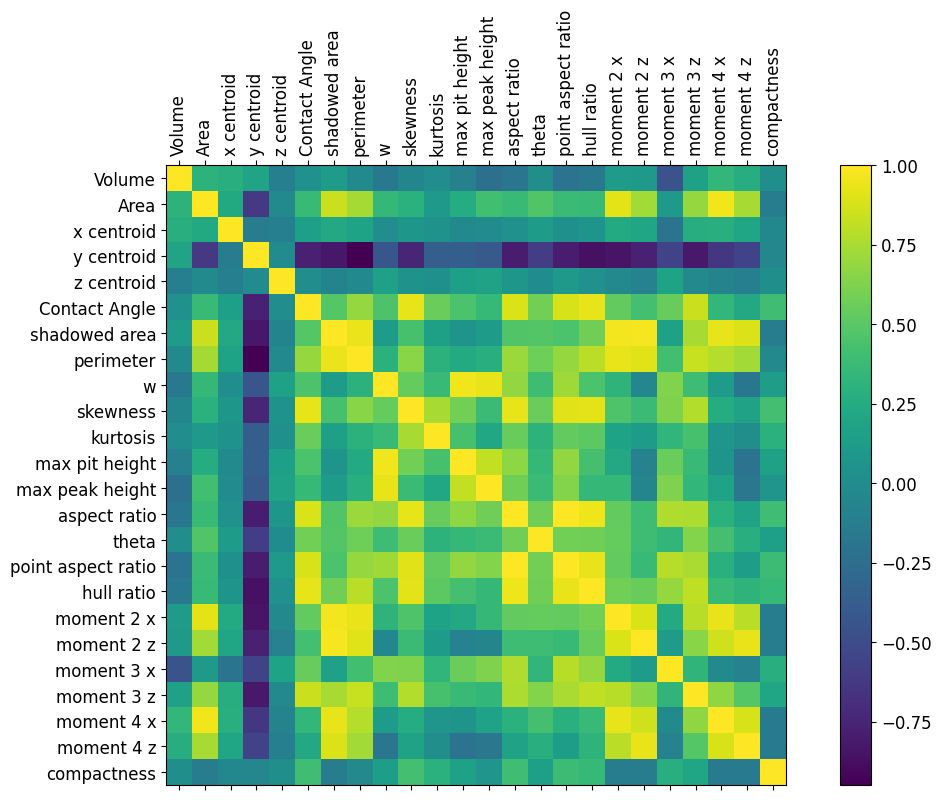

time: 459 ms (started: 2023-07-12 09:13:54 +02:00)


In [115]:
# Correlation matrix
correlationMatrix = pd.DataFrame(y_data).corr() 

f = plt.figure(figsize=(14, 8))
plt.matshow(correlationMatrix, fignum=f.number)
plt.xticks(range(y_data.shape[1]), y_data.columns, fontsize=12, rotation=90)
plt.yticks(range(y_data.shape[1]), y_data.columns, fontsize=12)
cb = plt.colorbar()
cb.ax.tick_params(labelsize=12)
plt.show()

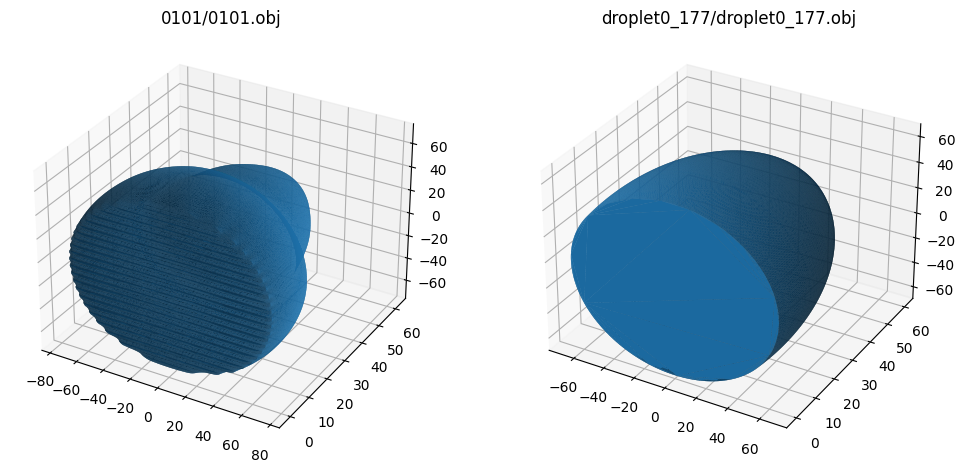

time: 12.7 s (started: 2023-07-12 09:13:55 +02:00)


In [116]:
obj_path ='/pfs/work7/workspace/scratch/oy0026-DDE2_droplet/OBJ/'

filenames = []
for (dirpath, dirnames, file_name) in walk(obj_path):
    for dirname in dirnames:
        for (dirpath, dirnames, file_name) in walk(obj_path+dirname):
            filenames.append(dirname+'/'+file_name[0])
    break
filenames = sorted(filenames)

fig = plt.figure()
display3Dlist = [100,1100]
for i in range(1,3):
    mesh = trimesh.load_mesh(os.path.join(obj_path, filenames[display3Dlist[i-1]]))
    ax = fig.add_subplot(1, 2, i, projection='3d')
    ax.set_title(filenames[display3Dlist[i-1]])
    ax.plot_trisurf(mesh.vertices[:, 0], mesh.vertices[:,1], mesh.vertices[:,2], triangles=mesh.faces)
plt.show()

## 4.0 Plotting functions

In [117]:
# Folder Name for storing plots
folder_name = datetime.now().strftime('%Y_%m_%d %Hh %M')

time: 329 µs (started: 2023-07-12 09:14:07 +02:00)


In [118]:
# Defining our function to see the evolution of error:
def plot_learning_curves(history, title, save_results):
    #We will omit the first 0 points for a better visualization:
    plt.plot(history['epoch'][0:],history['loss'][0:], "k--", linewidth=1.5, label="Training")
    plt.plot(history['epoch'][0:],history['val_loss'][0:], "b-.", linewidth=1.5, label="Validation")
    plt.legend()
    # plt.ylim(1,100)
    plt.yscale("log")
    plt.xlabel("Epochs"),  plt.ylabel("Loss")
    if(save_results): 
        if(os.path.exists(f'plots/{folder_name}') == False): os.mkdir(f'plots/{folder_name}')
    if(save_results): plt.savefig(f'plots/{folder_name}/{title}.svg', dpi=300, format='svg', transparent=False) # , edgecolor='w', facecolor='w'

time: 5.86 ms (started: 2023-07-12 09:14:07 +02:00)


In [119]:
def plotting(y, y_pred, y_label=f'Volume V', save_results=False):
    
    title = f"predicted {y_label.split(' ')[0]} vs test data {y_label.split(' ')[0]}"
    
    fig, ax = plt.subplots()

    ax.plot(y, label=f"true {y_label.split(' ')[0]}", lw=1)
    ax.plot(y_pred, label=f"predicted {y_label.split(' ')[0]}", lw=1)
    
    ax.set_xlabel('')
    ax.set_ylabel(y_label)
    ax.legend(loc='upper right', shadow=False, fancybox=False, facecolor='white', edgecolor='black')
    ax.set_title(title)
    
    if(save_results): 
        if(os.path.exists(f'plots/{folder_name}') == False):
            os.mkdir(f'plots/{folder_name}')
    if(save_results): plt.savefig(f'plots/{folder_name}/{title}.svg', dpi=300, format='svg', transparent=False) # , edgecolor='w', facecolor='w'

time: 4.82 ms (started: 2023-07-12 09:14:07 +02:00)


In [120]:
#creating a pandas df to store the results
column_labels= ['Volume', 'Area', 'y centroid' , 'Contact Angle', 'shadowed area' , 'perimeter', 'compactness', 'w', 'skewness', 'kurtosis', 'max pit height', 'max peak height',
          'aspect ratio', 'theta', 'point aspect ratio', 'hull ratio', 'moment 2 x', 'moment 2 z', 'moment 3 x', 'moment 3 z']
score_df=pd.DataFrame(columns=column_labels)


time: 12.6 ms (started: 2023-07-12 09:14:07 +02:00)


In [121]:
# Printing a dataframe as a table
def print_stats(df):
    fig, ax = plt.subplots(1,1)
    fig.set_figwidth(3)
    fig.set_figheight(3)
    fig.set_dpi(300)
    ax.axis('tight')
    ax.axis('off')
    ax.table(cellText=df.values.T, colLabels=df.index, rowLabels=df.columns,loc="center", bbox = [0,0,2,2])
    plt.show()

time: 1.81 ms (started: 2023-07-12 09:14:07 +02:00)


In [122]:
def visualize_accuracy(y_pred, y_true):
    fig=plt.figure(figsize=(20, 30))
    for i in range(len(y_true[0])):
        ax = fig.add_subplot(7,3, i+1)
        plt.scatter( y_true[:,i], y_pred[:,i] )
        plt.xlabel('True '+ featuresToScale[i])
        plt.ylabel('Predicted '+ featuresToScale[i])
        lims=[min(y_pred[:,i].min(), y_true[:,i].min()), max(y_pred[:,i].max(), y_true[:,i].max())]
        plt.xlim(lims), plt.ylim(lims)
        plt.plot(lims, lims)

time: 951 µs (started: 2023-07-12 09:14:07 +02:00)


In [123]:
def compare_stats(df1,df2,df3,labels):
    x_labels= ['Volume', 'Area', 'y centroid' , 'Contact Angle', 'shadowed area' , 'perimeter', 'compactness', 'w', 'skewness', 'kurtosis', 'max pit height', 'max peak height',
          'aspect ratio', 'theta', 'point aspect ratio', 'hull ratio', 'moment 2 x', 'moment 2 z', 'moment 3 x', 'moment 3 z']
    x=np.arange(len(x_labels))
    fig=plt.figure(figsize=(20, 10))
    ax = fig.add_subplot(1,3, 1)
    
    plt.plot(x,[float(re.findall("\d+\.\d+",entry)[0]) for entry in df1.loc["R²"].values],label=str(labels[0]), linestyle='--', marker='o',)
    plt.plot(x,[float(re.findall("\d+\.\d+",entry)[0]) for entry in df2.loc["R²"].values],label=str(labels[1]), linestyle='--', marker='o',)
    plt.plot(x,[float(re.findall("\d+\.\d+",entry)[0]) for entry in df3.loc["R²"].values],label=str(labels[2]), linestyle='--', marker='o',)
    plt.legend()
    plt.ylabel("R² in %")
    # Set number of ticks for x-axis
    ax.set_xticks(x)
    # Set ticks labels for x-axis
    ax.set_xticklabels(x_labels, rotation='vertical', fontsize=10)
    ax = fig.add_subplot(1,3,2)
    plt.plot(x,df1.loc["MSE"].values.astype(float),label=str(labels[0]), linestyle='--', marker='o',)
    plt.plot(x,df2.loc["MSE"].values.astype(float),label=str(labels[1]), linestyle='--', marker='o',)
    plt.plot(x,df3.loc["MSE"].values.astype(float),label=str(labels[2]), linestyle='--', marker='o',)
    plt.legend()
    plt.ylabel("MSE")
    # Set number of ticks for x-axis
    ax.set_xticks(x)
    # Set ticks labels for x-axis
    ax.set_xticklabels(x_labels, rotation='vertical', fontsize=10)
    ax = fig.add_subplot(1,3,3)
    plt.plot(x,df1.loc["MAE"].values.astype(float),label=str(labels[0]), linestyle='--', marker='o',)
    plt.plot(x,df2.loc["MAE"].values.astype(float),label=str(labels[1]), linestyle='--', marker='o',)
    plt.plot(x,df3.loc["MAE"].values.astype(float),label=str(labels[2]), linestyle='--', marker='o',)
    # Set number of ticks for x-axis
    ax.set_xticks(x)
    # Set ticks labels for x-axis
    ax.set_xticklabels(x_labels, rotation='vertical', fontsize=10)
    plt.legend()
    plt.ylabel("MAE")

time: 1.72 ms (started: 2023-07-12 09:14:07 +02:00)


## 5.0 Preparing y data

In [124]:
#Select relevant data and rescale so that they are normalized 
featuresToScale = ['Volume','Area', 'y centroid','Contact Angle', 'shadowed area', 'perimeter', 'compactness', 'w', 'skewness', 'kurtosis', 'max pit height', 'max peak height', 'aspect ratio', 
                   'theta', 'point aspect ratio', 'hull ratio', 'moment 2 x', 'moment 2 z', 'moment 3 x', 'moment 3 z']
sY = pp.StandardScaler(copy=True)
y_data_rel = pd.DataFrame(np.vstack((y_data['Volume'].values,y_data['Area'].values,y_data['y centroid'].values,y_data['Contact Angle'].values,y_data['shadowed area'].values,
                                     y_data['perimeter'].values, y_data['compactness'].values,y_data['w'].values,y_data['skewness'].values,y_data['kurtosis'].values,y_data['max pit height'].values,
                                     y_data['max peak height'].values,y_data['aspect ratio'].values,y_data['theta'].values,y_data['point aspect ratio'].values,y_data['hull ratio'].values,
                                     y_data['moment 2 x'].values,y_data['moment 2 z'].values,y_data['moment 3 x'].values,y_data['moment 3 z'].values)).T,columns=featuresToScale)
y_data_rel.loc[:,featuresToScale] = sY.fit_transform(y_data_rel[featuresToScale])
#Looking into the statistics again:
y_data_rel.describe()

,Volume,Area,y centroid,Contact Angle,shadowed area,perimeter,compactness,w,skewness,kurtosis,max pit height,max peak height,aspect ratio,theta,point aspect ratio,hull ratio,moment 2 x,moment 2 z,moment 3 x,moment 3 z
count,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03,1.479000e+03
mean,-8.340109e-15,-3.459032e-16,-1.921684e-17,5.668968e-16,-1.921684e-16,-5.765053e-17,3.062684e-17,-8.167158e-17,1.056926e-16,-6.245474e-17,1.921684e-17,-1.921684e-17,-1.153011e-16,-1.489305e-16,1.921684e-16,3.074695e-16,7.686737e-17,-1.153011e-16,-1.153011e-16,-2.402105e-18
std,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00,1.000338e+00
min,-1.672944e+00,-1.144348e+00,-1.002473e+00,-2.720524e+00,-1.694178e+00,-2.333119e+00,-1.057120e+00,-1.318513e+00,-2.716981e+00,-1.513638e+00,-1.256625e+00,-1.033669e+00,-2.788718e+00,-1.705671e+00,-2.740138e+00,-2.933010e+00,-1.721706e+00,-1.605598e+00,-3.133593e+00,-2.392878e+00
25%,-7.733736e-01,-7.549959e-01,-4.718951e-01,-7.463599e-02,-4.607467e-01,-1.753623e-01,-2.301106e-01,-7.601638e-01,-1.514470e-02,-2.442470e-01,-7.518394e-01,-8.021893e-01,4.415666e-02,-1.065565e+00,-2.838721e-02,3.283058e-01,-5.480609e-01,-4.778856e-01,-2.356266e-01,-5.778547e-02
50%,-3.311344e-01,-2.468686e-01,-4.333881e-01,2.115017e-01,-9.261943e-02,1.589343e-01,-2.353469e-02,-3.094094e-01,2.476964e-01,4.707533e-02,-2.112275e-01,-4.338603e-01,1.579192e-01,-4.844825e-02,1.246044e-01,3.473834e-01,1.664062e-01,-3.339723e-01,1.537833e-01,-4.584931e-02
75%,1.064486e+00,3.716910e-01,1.163597e-01,5.888623e-01,4.935721e-01,5.235239e-01,6.262713e-02,1.187369e+00,3.885075e-01,2.046867e-01,8.988402e-01,5.238328e-01,6.493158e-01,9.357072e-01,7.119270e-01,3.510417e-01,2.969752e-01,7.408499e-01,2.546588e-01,2.394585e-01
max,1.786444e+00,3.421671e+00,3.043535e+00,1.984161e+00,3.019371e+00,1.857141e+00,2.003597e+01,3.502016e+00,5.744070e+00,2.657874e+01,4.368124e+00,2.055440e+00,2.668738e+00,9.366731e-01,2.306350e+00,3.510417e-01,2.376871e+00,3.510499e+00,2.871323e+00,3.298018e+00


time: 116 ms (started: 2023-07-12 09:14:07 +02:00)


## 6.0 Multioutput prediction

For multi output prediction we decided to leave out the x centroid and z centroid coordinate, as we found it to be uninformative because of the droplet being rotationally symmetrical (look at the histogram plots). 

In [125]:
print('X_min: ',sorted_images.min())
print('X_max: ',sorted_images.max())

X_min:  0.0
X_max:  1.0
time: 2.14 s (started: 2023-07-12 09:14:08 +02:00)


In [126]:
# As the image values are already between 0 and 1 one the X-matrix does not need to be scaled
X = sorted_images
y = y_data_rel.copy()
print(y.shape)
seed = 2023
X, y = shuffle(X, y, random_state = seed)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=12)

print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(1479, 20)
(1331, 512, 512, 3) (148, 512, 512, 3)
(1331, 20) (148, 20)
time: 6.6 s (started: 2023-07-12 09:14:10 +02:00)


In [127]:
def build_model_CNN():
    # input array shape for the network:
    input_shape = X_train.shape[1],X_train.shape[2],X_train.shape[3]
    #Here we will use Sequential API like we did in MLP
    model = Sequential([
    Conv2D(32, (3, 3), padding='same', activation="relu", kernel_initializer="he_uniform", input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), padding='same', activation="relu", kernel_initializer="he_uniform"),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), padding='same', activation="relu", kernel_initializer="he_uniform"),
    MaxPooling2D((2, 2)),
    Flatten(),
    
    # Dense(6, activation='relu', kernel_initializer="he_uniform"),
    Dense(y_train.shape[1], activation="linear")
    ])
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    model.compile(optimizer=optimizer, loss = "mse", metrics=["mae", RSquare()]) 

    return model

time: 791 µs (started: 2023-07-12 09:14:16 +02:00)


In [128]:
#Looking at the graph:
build_model_CNN().summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 512, 512, 32)      896       
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 256, 256, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_13 (Conv2D)          (None, 256, 256, 64)      18496     
                                                                 
 max_pooling2d_13 (MaxPoolin  (None, 128, 128, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_14 (Conv2D)          (None, 128, 128, 128)     73856     
                                                                 
 max_pooling2d_14 (MaxPoolin  (None, 64, 64, 128)     

In [129]:
#We will first create the object to feed fit() method:
myCheckpoint= keras.callbacks.ModelCheckpoint("best_model_norm.h5", save_best_only=True)

myEarly_stopping = keras.callbacks.EarlyStopping(patience=20,restore_best_weights=True)

time: 562 µs (started: 2023-07-12 09:14:17 +02:00)


In [130]:
#Model Training
#--------------------------------------------------------------------------
#Hyperparameters
num_epochs = 100
batch_size = 4

time: 3.89 ms (started: 2023-07-12 09:14:17 +02:00)


In [131]:
# Model Training:
#-----------------------------------------------------------------------------
#Building the Keras models:
model_CNN = build_model_CNN()

#Training step: Trains the model in silent mode (verbose = 0)
history= model_CNN.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_split=0.1, 
                                callbacks=[myCheckpoint,myEarly_stopping])#, verbose=0)
#Calling back the best model:
model_best= keras.models.load_model("best_model_norm.h5")

Epoch 1/100
300/300 [==============================] - 10s 25ms/step - loss: 50.7631 - mae: 1.2407 - r_square: -48.2218 - val_loss: 0.1201 - val_mae: 0.2099 - val_r_square: 0.8453
Epoch 2/100
300/300 [==============================] - 5s 15ms/step - loss: 0.1779 - mae: 0.2056 - r_square: 0.8338 - val_loss: 0.1039 - val_mae: 0.1931 - val_r_square: 0.8557
Epoch 3/100
300/300 [==============================] - 5s 15ms/step - loss: 0.1403 - mae: 0.1737 - r_square: 0.8696 - val_loss: 0.0986 - val_mae: 0.1951 - val_r_square: 0.8617
Epoch 4/100
300/300 [==============================] - 5s 15ms/step - loss: 0.1316 - mae: 0.1766 - r_square: 0.8774 - val_loss: 0.0831 - val_mae: 0.1695 - val_r_square: 0.8932
Epoch 5/100
300/300 [==============================] - 5s 15ms/step - loss: 0.1150 - mae: 0.1579 - r_square: 0.8931 - val_loss: 0.0825 - val_mae: 0.1677 - val_r_square: 0.8946
Epoch 6/100
300/300 [==============================] - 5s 15ms/step - loss: 0.1081 - mae: 0.1539 - r_square: 0.8995 

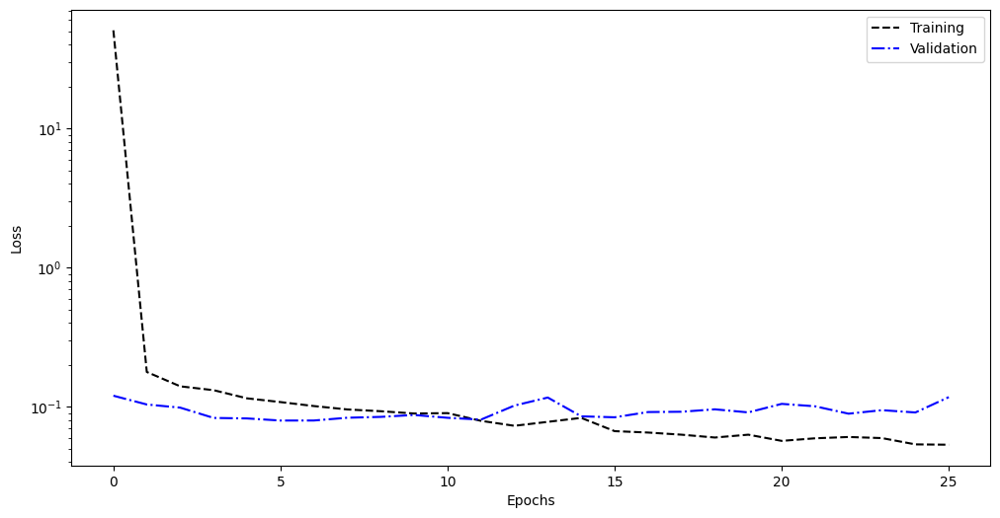

time: 366 ms (started: 2023-07-12 09:16:21 +02:00)


In [132]:
hist = pd.DataFrame(history.history)
hist["epoch"] = history.epoch

# Plotting the results:
# Remember that we defined our loss as MSE in the model.
plot_learning_curves(hist, "Learning curve normalized, two outputs", True)

In [133]:
# Result of the selected Model
best_run = None

if hist["epoch"].iloc[-1] == num_epochs:
    best_run = hist.iloc[-1]
else:
    best_run = hist.iloc[-21]
best_run

loss            0.108100
mae             0.153859
r_square        0.899545
val_loss        0.079630
val_mae         0.157387
val_r_square    0.893797
epoch           5.000000
Name: 5, dtype: float64

time: 3.08 ms (started: 2023-07-12 09:16:21 +02:00)


In [134]:
y_predicted = model_CNN.predict(X_test) 
print(y_predicted.shape)
print(y_test.shape)

y_test = np.array(y_test)

5/5 [==============================] - 0s 34ms/step
(148, 20)
(148, 20)
time: 970 ms (started: 2023-07-12 09:16:21 +02:00)


In [135]:
y_predicted_backTrafo = sY.inverse_transform(y_predicted)
y_test_backTrafo = sY.inverse_transform(y_test)

time: 1.45 ms (started: 2023-07-12 09:16:22 +02:00)


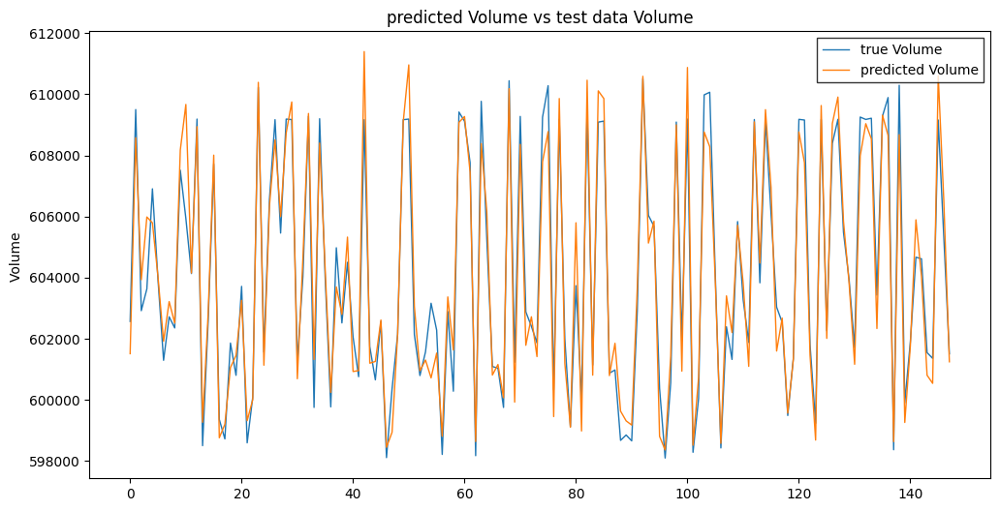

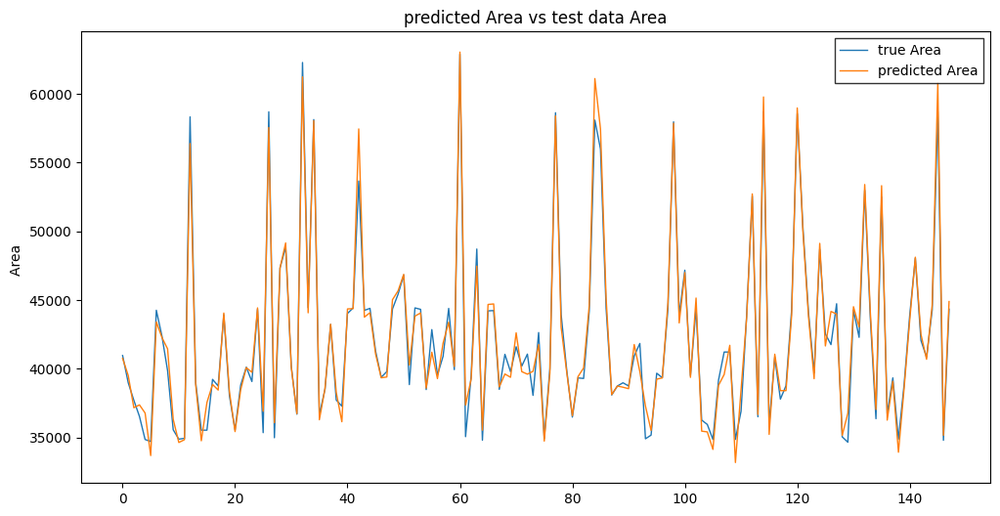

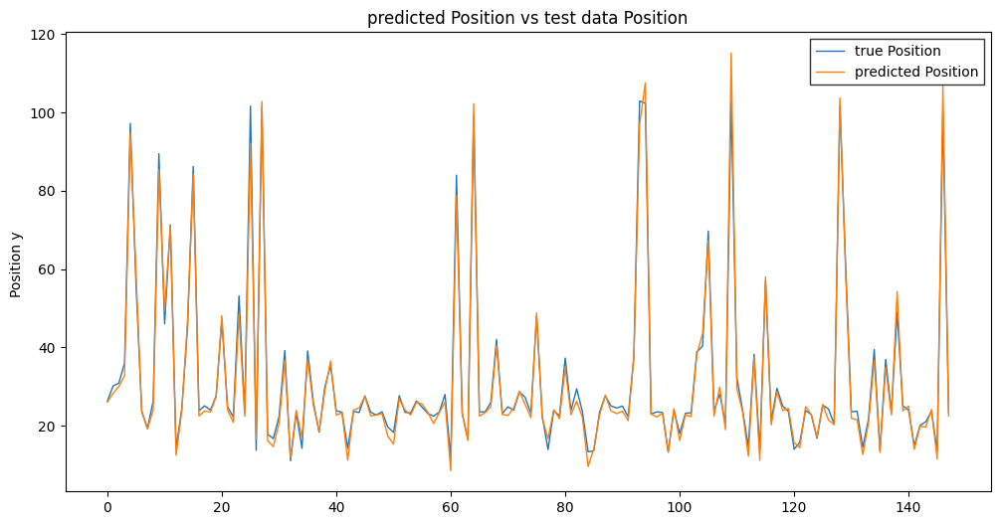

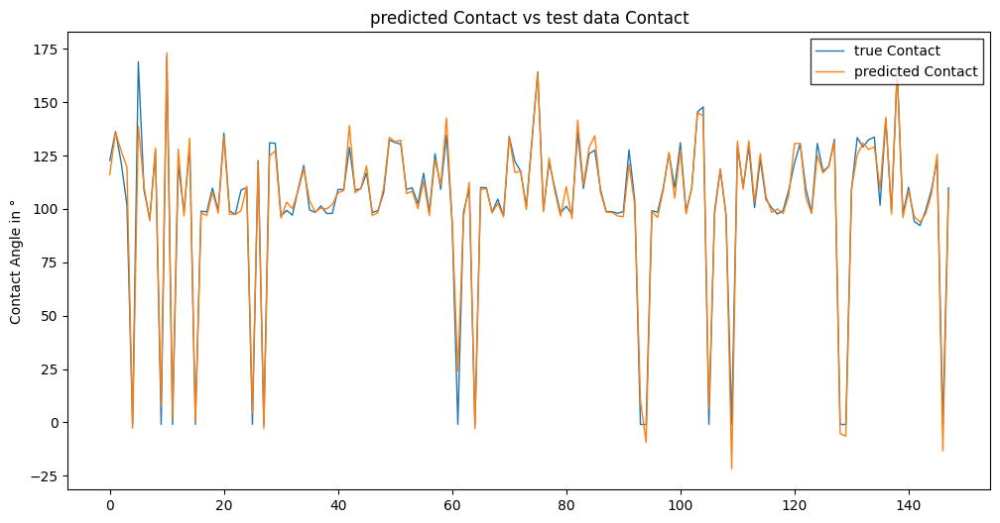

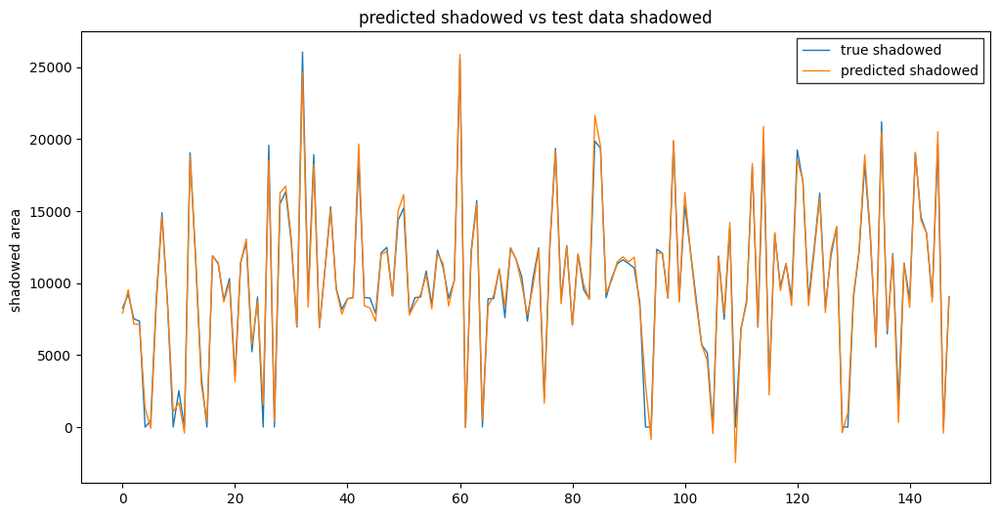

...

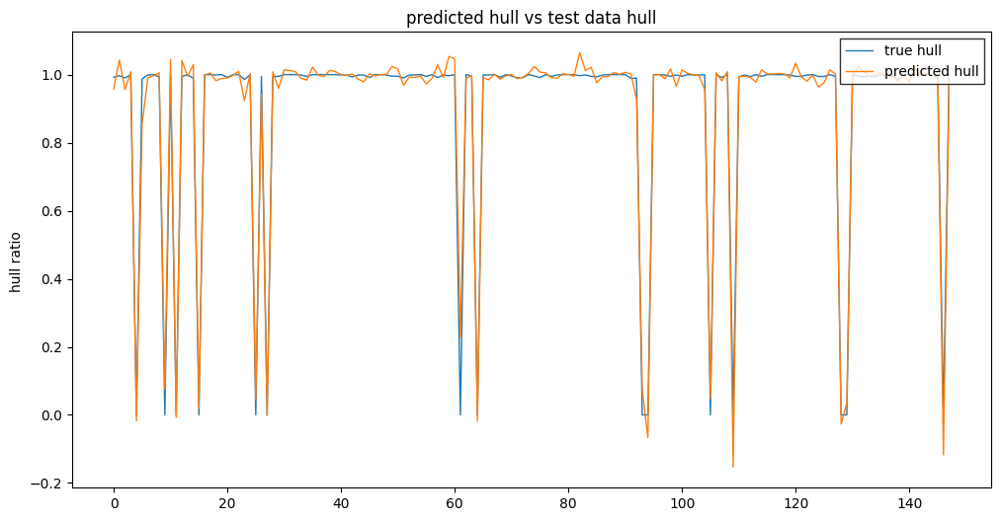

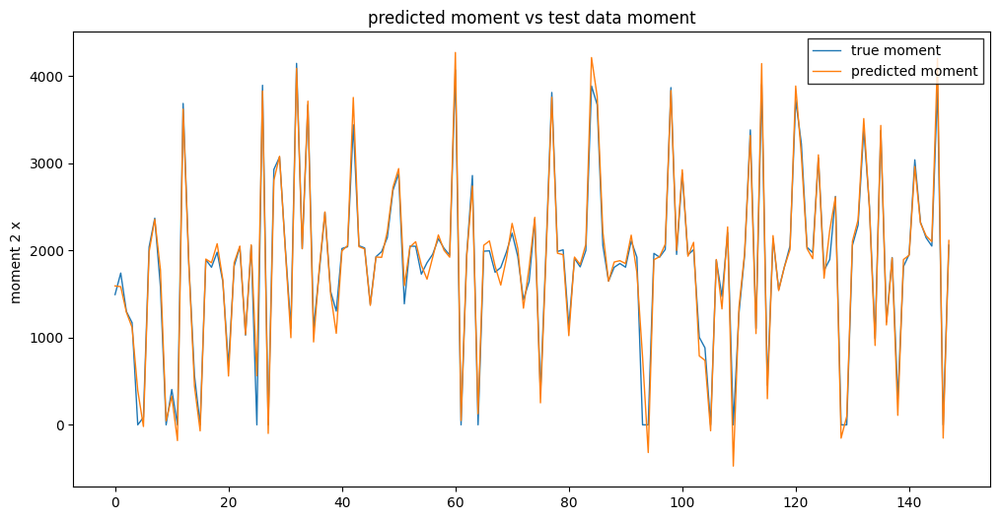

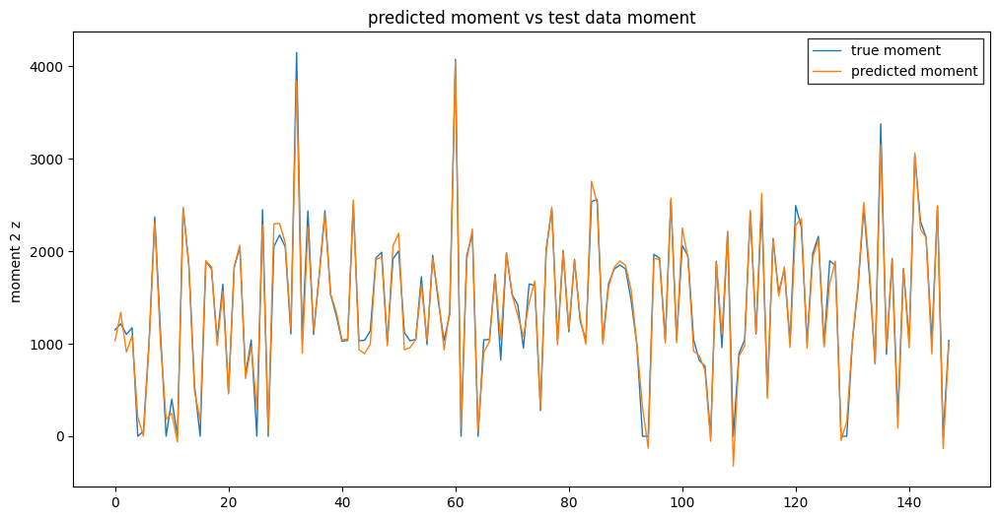

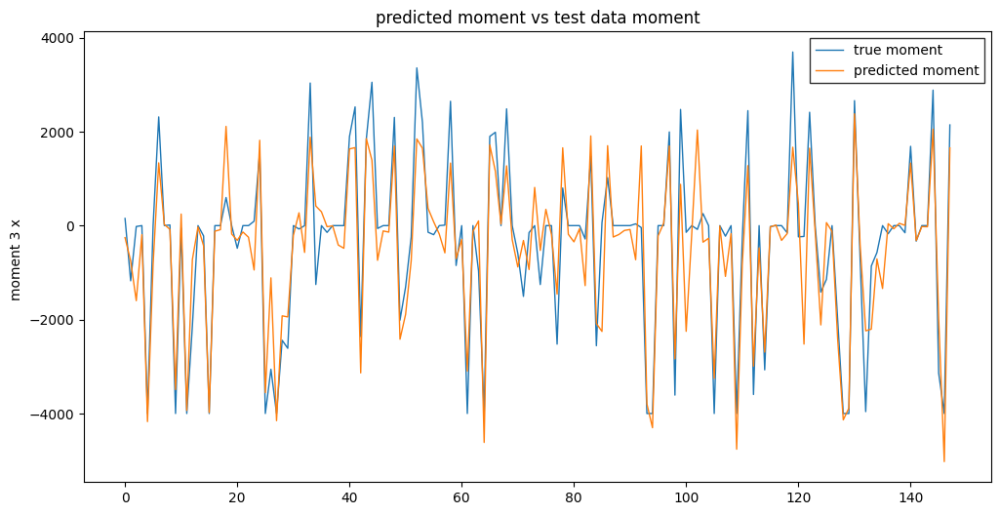

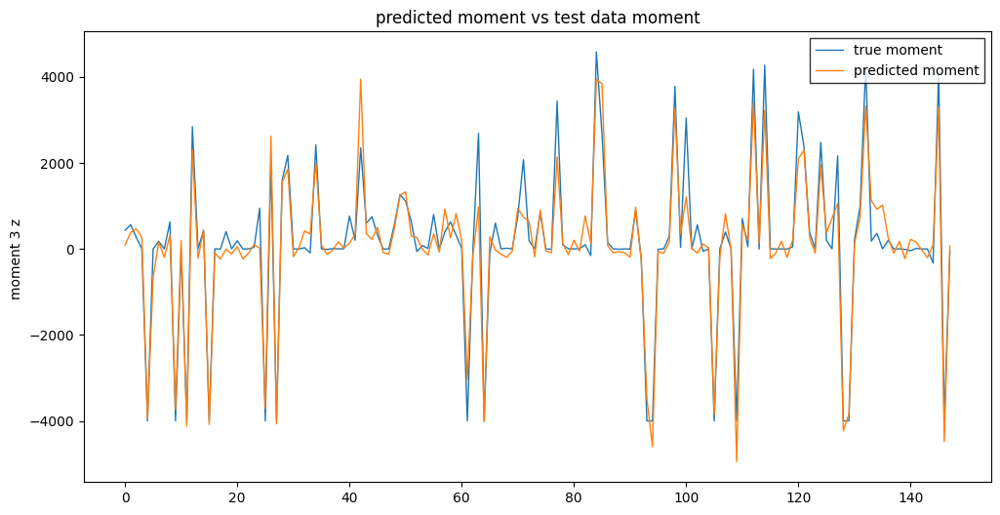

time: 5.23 s (started: 2023-07-12 09:16:22 +02:00)


In [136]:
# compare back-transformed predicted data with back-transformed original data

#Plotting Volume Prediction
plotting(y_test_backTrafo[:,0], y_predicted_backTrafo[:,0], 'Volume ', True)

#Plotting Area Prediction
plotting(y_test_backTrafo[:,1], y_predicted_backTrafo[:,1], 'Area ', True)

#Plotting Centroid y Prediction
plotting(y_test_backTrafo[:,2], y_predicted_backTrafo[:,2], 'Position y ', True)

#Plotting Contact Angle Prediction
plotting(y_test_backTrafo[:,3], y_predicted_backTrafo[:,3],'Contact Angle in °', True)

#Plotting shadowed area
plotting(y_test_backTrafo[:,4], y_predicted_backTrafo[:,4], 'shadowed area ', True)

#Plotting perimeter
plotting(y_test_backTrafo[:,5], y_predicted_backTrafo[:,5], 'perimeter ', True)

#Plotting perimeter
plotting(y_test_backTrafo[:,6], y_predicted_backTrafo[:,6], 'compactness ', True)

#Plotting w
plotting(y_test_backTrafo[:,7], y_predicted_backTrafo[:,7], 'w ', True)

#Plotting skewness
plotting(y_test_backTrafo[:,8], y_predicted_backTrafo[:,8], 'skewness ', True)

#Plotting kurtosis
plotting(y_test_backTrafo[:,9], y_predicted_backTrafo[:,9], 'kurtosis ', True)

#Plotting max pit height
plotting(y_test_backTrafo[:,10], y_predicted_backTrafo[:,10], 'max pit height ', True)

#Plotting max peak height
plotting(y_test_backTrafo[:,11], y_predicted_backTrafo[:,11], 'max peak height ', True)

#Plotting aspect ratio
plotting(y_test_backTrafo[:,12], y_predicted_backTrafo[:,12], 'aspect ratio', True)

#Plotting theta
plotting(y_test_backTrafo[:,13], y_predicted_backTrafo[:,13], 'theta ', True)

#Plotting point aspect ratio
plotting(y_test_backTrafo[:,14], y_predicted_backTrafo[:,14], 'point aspect ratio', True)

#Plotting hull ratio
plotting(y_test_backTrafo[:,15], y_predicted_backTrafo[:,15], 'hull ratio ', True)

#Plotting moment 2 x
plotting(y_test_backTrafo[:,16], y_predicted_backTrafo[:,16], 'moment 2 x ', True)

#Plotting moment 2 z
plotting(y_test_backTrafo[:,17], y_predicted_backTrafo[:,17], 'moment 2 z ', True)

#Plotting moment 3 x
plotting(y_test_backTrafo[:,18], y_predicted_backTrafo[:,18], 'moment 3 x ', True)

#Plotting moment 3 z
plotting(y_test_backTrafo[:,19], y_predicted_backTrafo[:,19], 'moment 3 z ', True)

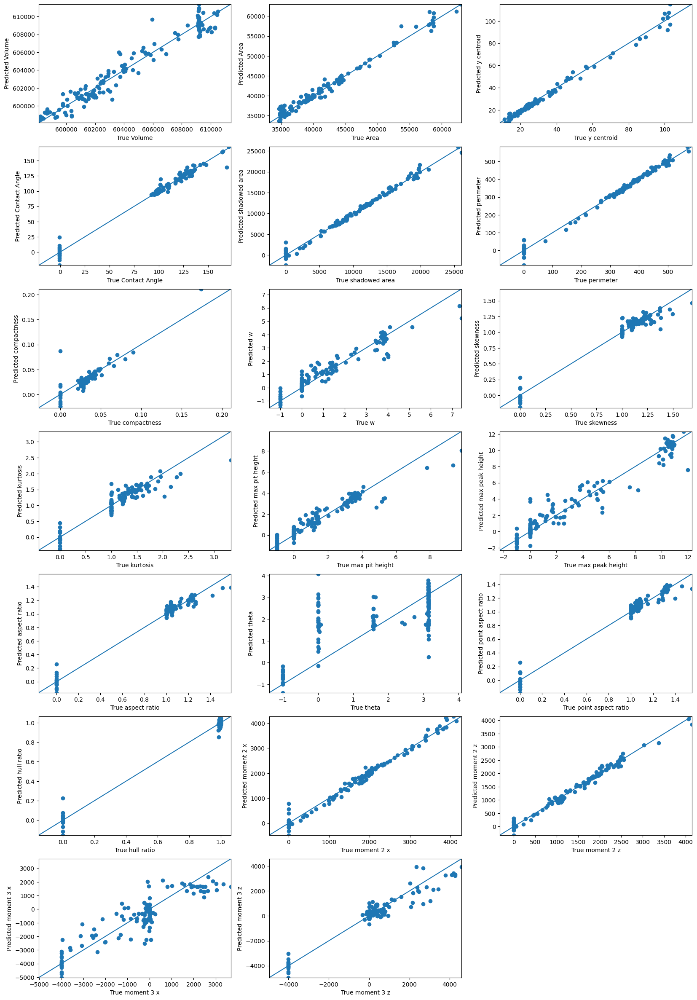

time: 2.57 s (started: 2023-07-12 09:16:27 +02:00)


In [137]:
visualize_accuracy(y_predicted_backTrafo, y_test_backTrafo)

In [138]:
data = []
for i in range (len(y_test_backTrafo[0])):
    score = r2_score(y_test_backTrafo[:,i], y_predicted_backTrafo[:,i])
    mae = mean_absolute_error(y_test_backTrafo[:,i], y_predicted_backTrafo[:,i])
    mse = mean_squared_error(y_test_backTrafo[:,i], y_predicted_backTrafo[:,i])
    data.append([score, mae, mse])
column_labels= ['Volume', 'Area' , 'y centroid','Contact Angle', 'shadowed area' , 'perimeter','compactness', 'w', 'skewness', 'kurtosis', 'max pit height', 'max peak height',
                'aspect ratio', 'theta', 'point aspect ratio', 'hull ratio', 'moment 2 x', 'moment 2 z', 'moment 3 x', 'moment 3 z']
temp = pd.DataFrame(np.array(data).T,columns=column_labels)
temp.index = ["R²", "MAE", "MSE"]
score_df[['Volume', 'Area', 'y centroid' , 'Contact Angle', 'shadowed area' , 'perimeter','compactness', 'w', 'skewness', 'kurtosis', 'max pit height', 'max peak height',
          'aspect ratio', 'theta', 'point aspect ratio', 'hull ratio', 'moment 2 x', 'moment 2 z', 'moment 3 x', 'moment 3 z']] = temp

time: 17 ms (started: 2023-07-12 09:16:30 +02:00)


In [139]:
with_gp_score_df = score_df.copy()
with_gp_score_df.loc["R²"] = score_df.loc["R²"].apply(lambda x : f"{x*100:.2f}%")
with_gp_score_df.loc["MAE"] = score_df.loc["MAE"].apply(lambda x : f"{x:.2f}")
with_gp_score_df.loc["MSE"] = score_df.loc["MSE"].apply(lambda x : f"{x:.2f}")

time: 29.1 ms (started: 2023-07-12 09:16:30 +02:00)


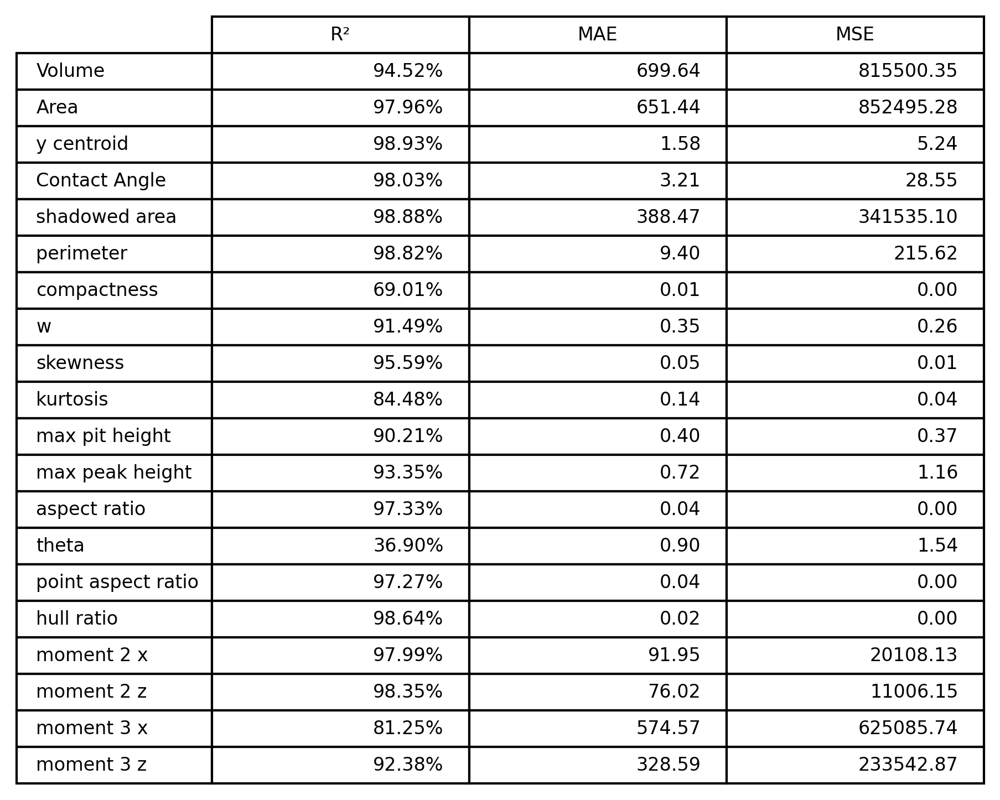

time: 552 ms (started: 2023-07-12 09:16:30 +02:00)


In [140]:
print_stats(with_gp_score_df)

## 7.0 Multioutput prediction without glarepoints

### 7.1 Remove glarepoints from data 

In [141]:
# to remove glarepoints from droplet images we just set the r and g channel to zero, 
# for a more detailed description see get_angles_from_pictures
print(sorted_images.shape)
cropped_images = sorted_images.copy()
cropped_images[:, :, :, 0:2] = 0
print(cropped_images.shape)

(1479, 512, 512, 3)
(1479, 512, 512, 3)
time: 5.25 s (started: 2023-07-12 09:16:30 +02:00)


In [142]:
print(sorted_images[0,0,0])
print(cropped_images[0,0,0])

[0.1372549  0.06666667 0.67058824]
[0.         0.         0.67058824]
time: 746 µs (started: 2023-07-12 09:16:36 +02:00)


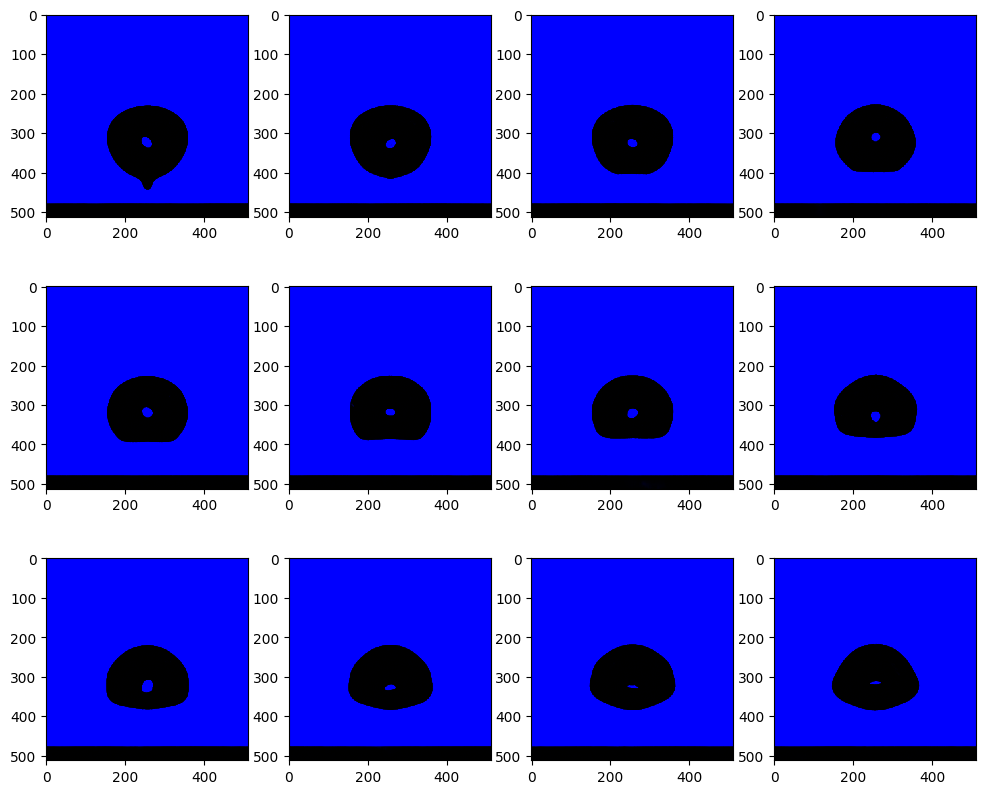

time: 1.78 s (started: 2023-07-12 09:16:36 +02:00)


In [143]:
# A closer look some of the images which have contact angle nan
mpl.rcParams['figure.figsize'] = [12.0, 12.0]

fig=plt.figure(figsize=(12, 10))
for i in range(1, 12 +1):
    ax = fig.add_subplot(3, 4, i)
    plt.imshow(cropped_images[nan_angle_indices[i]], interpolation='nearest')
plt.show()
mpl.rcParams['figure.figsize'] = [7.0, 5.0]

### 7.2 Multioutput prediction without glarepoints but with model trained on glarepoint data

In [144]:
X_wo_gp = cropped_images
y = y_data_rel.copy(deep=True)
print(y.shape)
X, y = shuffle(X_wo_gp, y, random_state = seed)

X_train_wo_gp, X_test_wo_gp, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=12)

print(X_train_wo_gp.shape, X_test_wo_gp.shape)
print(y_train.shape, y_test.shape)

(1479, 20)
(1331, 512, 512, 3) (148, 512, 512, 3)
(1331, 20) (148, 20)
time: 6.62 s (started: 2023-07-12 09:16:37 +02:00)


In [145]:
model_best = keras.models.load_model("best_model_norm.h5")

time: 307 ms (started: 2023-07-12 09:16:44 +02:00)


In [146]:
y_predicted_wo_gp = model_best.predict(X_test_wo_gp) 
print(y_predicted_wo_gp.shape)
print(y_test.shape)

y_test = np.array(y_test)

5/5 [==============================] - 0s 34ms/step
(148, 20)
(148, 20)
time: 740 ms (started: 2023-07-12 09:16:44 +02:00)


In [147]:
y_predicted_wo_gp_backTrafo = sY.inverse_transform(y_predicted_wo_gp)
y_test_backTrafo = sY.inverse_transform(y_test)

time: 1.19 ms (started: 2023-07-12 09:16:45 +02:00)


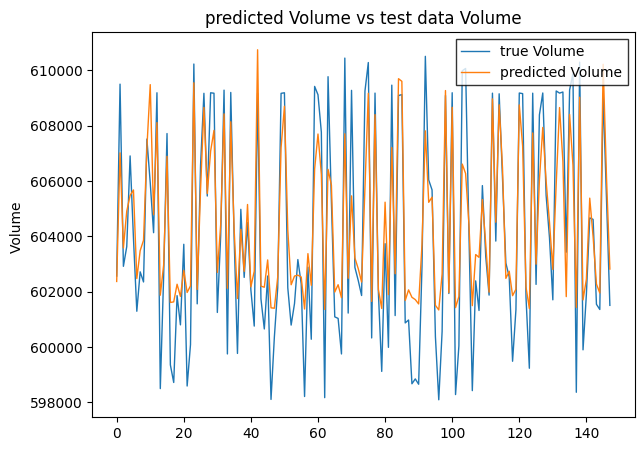

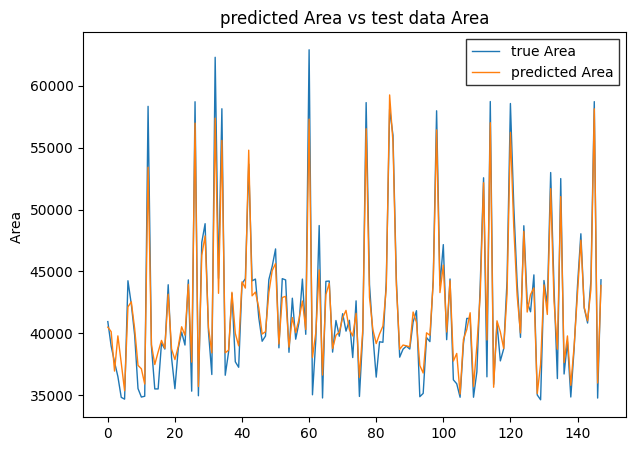

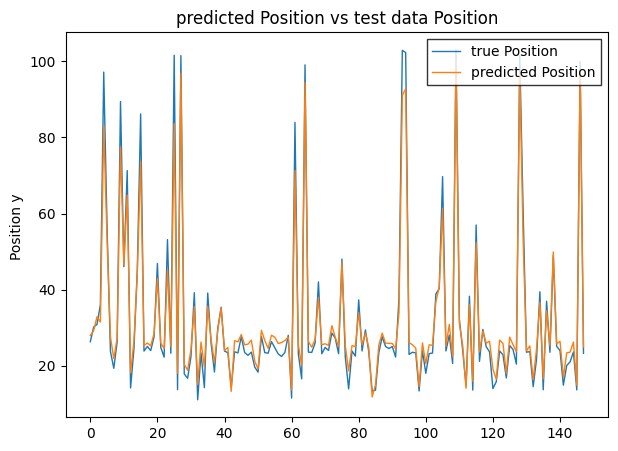

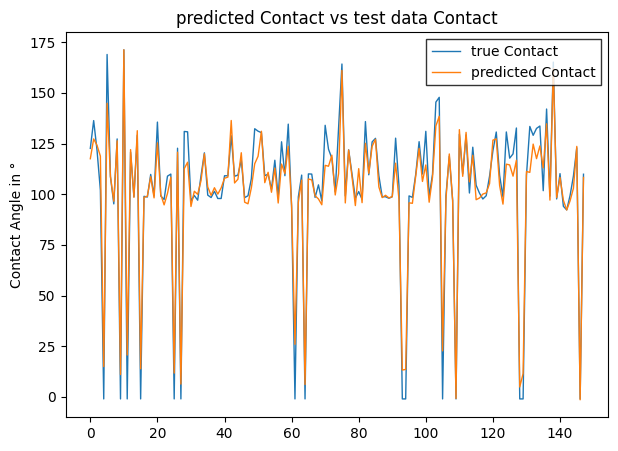

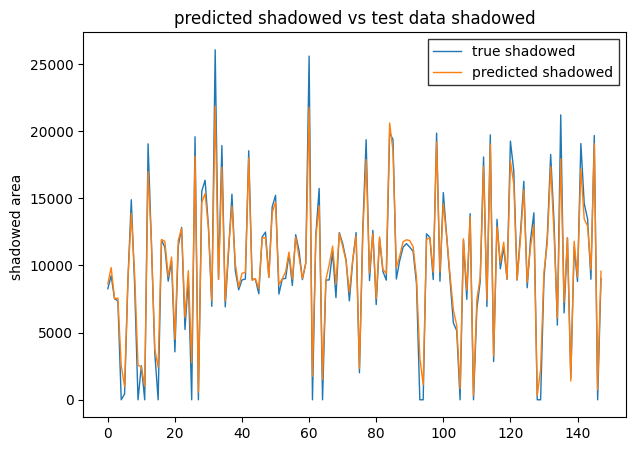

...

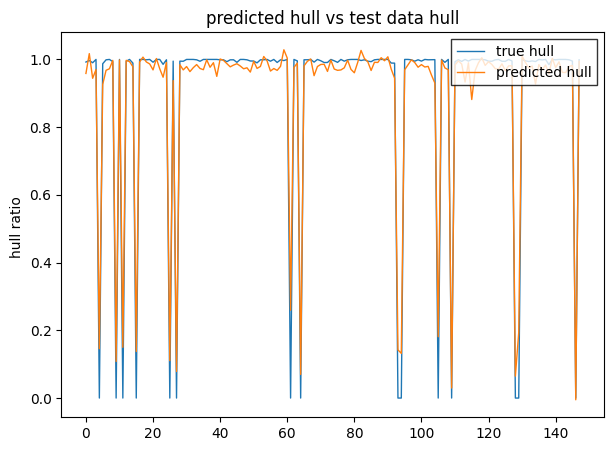

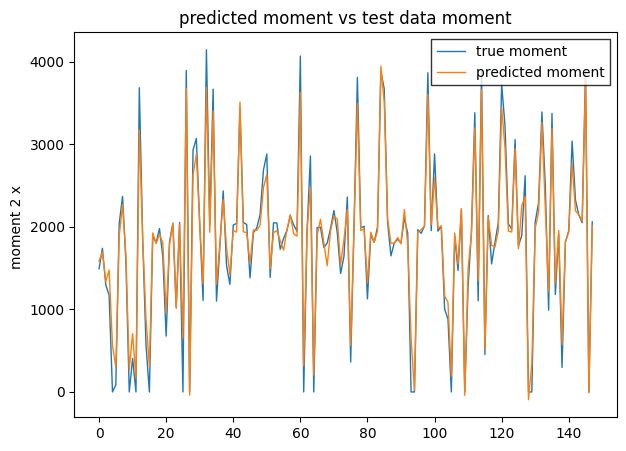

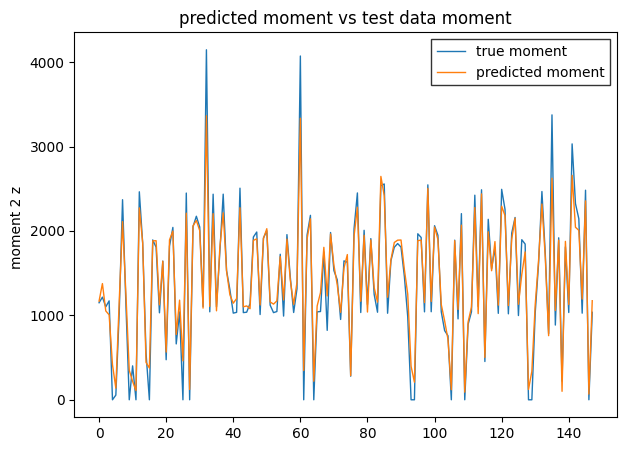

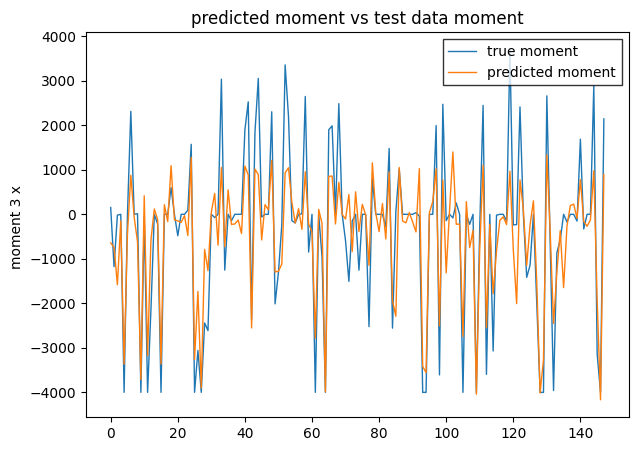

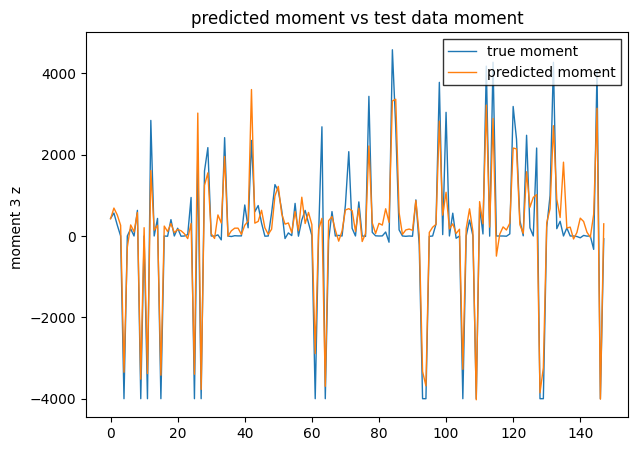

time: 4.84 s (started: 2023-07-12 09:16:45 +02:00)


In [148]:
# compare back-transformed predicted data with back-transformed original data

#Plotting Volume Prediction
plotting(y_test_backTrafo[:,0], y_predicted_wo_gp_backTrafo[:,0], 'Volume ', True)

#Plotting Area Prediction
plotting(y_test_backTrafo[:,1], y_predicted_wo_gp_backTrafo[:,1], 'Area ', True)

#Plotting Centroid y Prediction
plotting(y_test_backTrafo[:,2], y_predicted_wo_gp_backTrafo[:,2], 'Position y ', True)

#Plotting Contact Angle Prediction
plotting(y_test_backTrafo[:,3], y_predicted_wo_gp_backTrafo[:,3],'Contact Angle in °', True)

#Plotting shadowed area
plotting(y_test_backTrafo[:,4], y_predicted_wo_gp_backTrafo[:,4], 'shadowed area ', True)

#Plotting perimeter
plotting(y_test_backTrafo[:,5], y_predicted_wo_gp_backTrafo[:,5], 'perimeter ', True)

#Plotting perimeter
plotting(y_test_backTrafo[:,6], y_predicted_wo_gp_backTrafo[:,6], 'compactness ', True)

#Plotting w
plotting(y_test_backTrafo[:,7], y_predicted_wo_gp_backTrafo[:,7], 'w ', True)

#Plotting skewness
plotting(y_test_backTrafo[:,8], y_predicted_wo_gp_backTrafo[:,8], 'skewness ', True)

#Plotting kurtosis
plotting(y_test_backTrafo[:,9], y_predicted_wo_gp_backTrafo[:,9], 'kurtosis ', True)

#Plotting max pit height
plotting(y_test_backTrafo[:,10], y_predicted_wo_gp_backTrafo[:,10], 'max pit height ', True)

#Plotting max peak height
plotting(y_test_backTrafo[:,11], y_predicted_wo_gp_backTrafo[:,11], 'max peak height ', True)

#Plotting aspect ratio
plotting(y_test_backTrafo[:,12], y_predicted_wo_gp_backTrafo[:,12], 'aspect ratio', True)

#Plotting theta
plotting(y_test_backTrafo[:,13], y_predicted_wo_gp_backTrafo[:,13], 'theta ', True)

#Plotting point aspect ratio
plotting(y_test_backTrafo[:,14], y_predicted_wo_gp_backTrafo[:,14], 'point aspect ratio', True)

#Plotting hull ratio
plotting(y_test_backTrafo[:,15], y_predicted_wo_gp_backTrafo[:,15], 'hull ratio ', True)

#Plotting moment 2 x
plotting(y_test_backTrafo[:,16], y_predicted_wo_gp_backTrafo[:,16], 'moment 2 x ', True)

#Plotting moment 2 z
plotting(y_test_backTrafo[:,17], y_predicted_wo_gp_backTrafo[:,17], 'moment 2 z ', True)

#Plotting moment 3 x
plotting(y_test_backTrafo[:,18], y_predicted_wo_gp_backTrafo[:,18], 'moment 3 x ', True)

#Plotting moment 3 z
plotting(y_test_backTrafo[:,19], y_predicted_wo_gp_backTrafo[:,19], 'moment 3 z ', True)

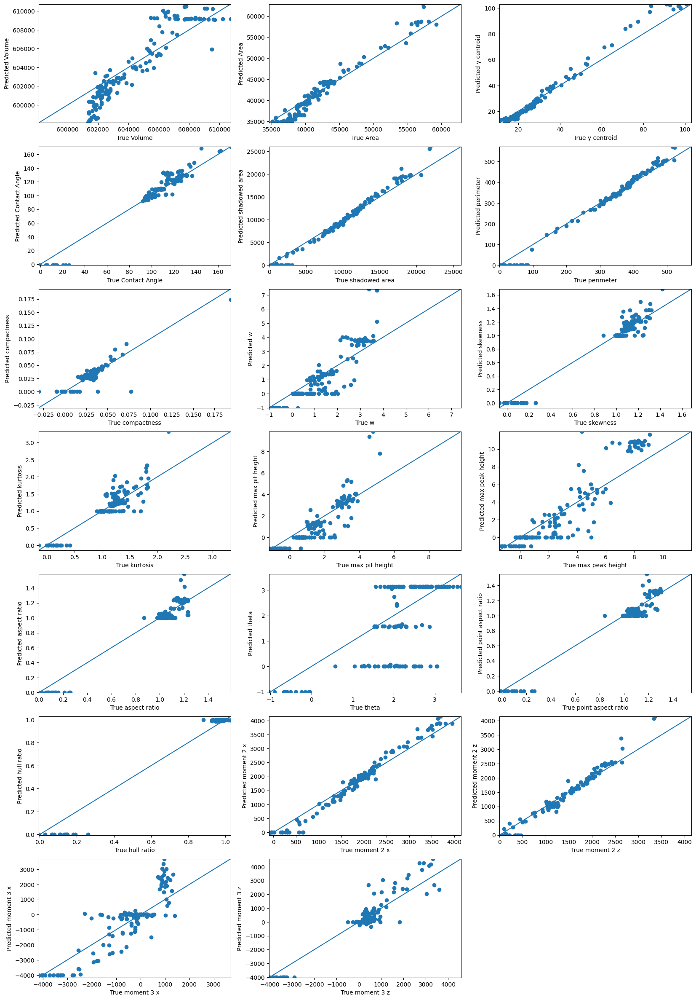

time: 2.8 s (started: 2023-07-12 09:16:50 +02:00)


In [149]:
visualize_accuracy(y_test_backTrafo,y_predicted_wo_gp_backTrafo)

In [150]:
data = []
for i in range (len(y_test_backTrafo[0])):
    score = r2_score(y_test_backTrafo[:,i], y_predicted_wo_gp_backTrafo[:,i])
    mae = mean_absolute_error(y_test_backTrafo[:,i], y_predicted_wo_gp_backTrafo[:,i])
    mse = mean_squared_error(y_test_backTrafo[:,i], y_predicted_wo_gp_backTrafo[:,i])
    data.append([score, mae, mse])
column_labels= ['Volume', 'Area' , 'y centroid','Contact Angle', 'shadowed area' , 'perimeter','compactness', 'w', 'skewness', 'kurtosis', 'max pit height', 'max peak height',
                'aspect ratio', 'theta', 'point aspect ratio', 'hull ratio', 'moment 2 x', 'moment 2 z', 'moment 3 x', 'moment 3 z']
temp = pd.DataFrame(np.array(data).T,columns=column_labels)
temp.index = ["R²", "MAE", "MSE"]
score_df[['Volume', 'Area', 'y centroid' , 'Contact Angle', 'shadowed area' , 'perimeter','compactness', 'w', 'skewness', 'kurtosis', 'max pit height', 'max peak height',
          'aspect ratio', 'theta', 'point aspect ratio', 'hull ratio', 'moment 2 x', 'moment 2 z', 'moment 3 x', 'moment 3 z']] = temp

time: 15.7 ms (started: 2023-07-12 09:16:53 +02:00)


In [151]:
wo_gp_score_df = score_df.copy()
wo_gp_score_df.loc["R²"] = score_df.loc["R²"].apply(lambda x : f"{x*100:.2f}%")
wo_gp_score_df.loc["MAE"] = score_df.loc["MAE"].apply(lambda x : f"{x:.2f}")
wo_gp_score_df.loc["MSE"] = score_df.loc["MSE"].apply(lambda x : f"{x:.2f}")

time: 8.58 ms (started: 2023-07-12 09:16:53 +02:00)


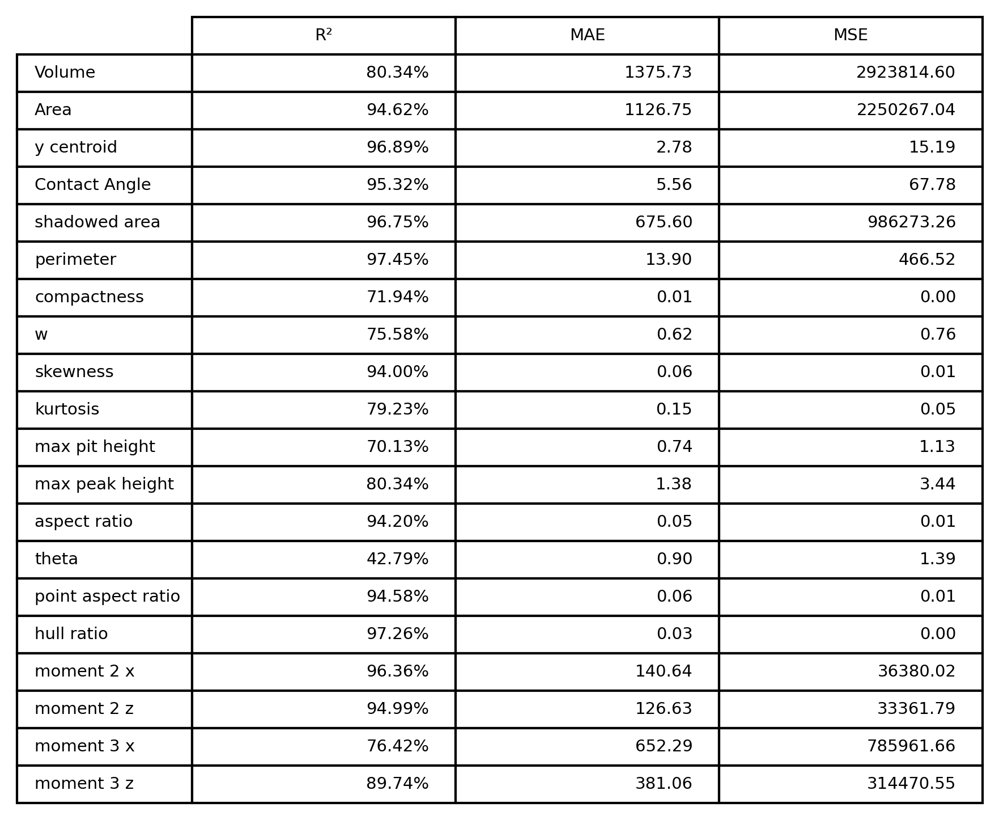

time: 517 ms (started: 2023-07-12 09:16:53 +02:00)


In [152]:
print_stats(wo_gp_score_df)

### 7.3 Predict with model trained on data without glarepoints

In [153]:
def build_model_CNN():
    # input array shape for the network:
    input_shape = X_train_wo_gp.shape[1],X_train_wo_gp.shape[2],X_train_wo_gp.shape[3]
    #Here we will use Sequential API like we did in MLP
    model = Sequential([
    Conv2D(32, (3, 3), padding='same', activation="relu", kernel_initializer="he_uniform", input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), padding='same', activation="relu", kernel_initializer="he_uniform"),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), padding='same', activation="relu", kernel_initializer="he_uniform"),
    MaxPooling2D((2, 2)),
    Flatten(),
    
    # Dense(6, activation='relu', kernel_initializer="he_uniform"),
    Dense(y_train.shape[1], activation="linear")
    ])
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    model.compile(optimizer=optimizer, loss = "mse", metrics=["mae", RSquare()]) 

    return model

time: 809 µs (started: 2023-07-12 09:16:53 +02:00)


In [154]:
#Looking at the graph:
build_model_CNN().summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_18 (Conv2D)          (None, 512, 512, 32)      896       
                                                                 
 max_pooling2d_18 (MaxPoolin  (None, 256, 256, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_19 (Conv2D)          (None, 256, 256, 64)      18496     
                                                                 
 max_pooling2d_19 (MaxPoolin  (None, 128, 128, 64)     0         
 g2D)                                                            
                                                                 
 conv2d_20 (Conv2D)          (None, 128, 128, 128)     73856     
                                                                 
 max_pooling2d_20 (MaxPoolin  (None, 64, 64, 128)     

In [155]:
#We will first create the object to feed fit() method:
myCheckpoint= keras.callbacks.ModelCheckpoint("best_model_norm_wo_gp.h5", save_best_only=True)

myEarly_stopping = keras.callbacks.EarlyStopping(patience=20,restore_best_weights=True)

time: 396 µs (started: 2023-07-12 09:16:53 +02:00)


In [156]:
#Model Training
#--------------------------------------------------------------------------
#Hyperparameters
num_epochs = 100
batch_size = 4

time: 4.14 ms (started: 2023-07-12 09:16:53 +02:00)


In [157]:
# Model Training:
#-----------------------------------------------------------------------------
#Building the Keras models:
model_CNN = build_model_CNN()

#Training step: Trains the model in silent mode (verbose = 0)
history= model_CNN.fit(X_train_wo_gp, y_train, epochs=num_epochs, batch_size=batch_size, validation_split=0.1, 
                               callbacks=[myCheckpoint,myEarly_stopping])
#Calling back the best model:
model_best= keras.models.load_model("best_model_norm_wo_gp.h5")

Epoch 1/100
300/300 [==============================] - 6s 17ms/step - loss: 85.9167 - mae: 1.4886 - r_square: -82.3652 - val_loss: 0.1441 - val_mae: 0.2401 - val_r_square: 0.8131
Epoch 2/100
300/300 [==============================] - 5s 15ms/step - loss: 0.1833 - mae: 0.2133 - r_square: 0.8283 - val_loss: 0.1044 - val_mae: 0.1892 - val_r_square: 0.8746
Epoch 3/100
300/300 [==============================] - 4s 14ms/step - loss: 0.1516 - mae: 0.1844 - r_square: 0.8586 - val_loss: 0.1129 - val_mae: 0.2240 - val_r_square: 0.8367
Epoch 4/100
300/300 [==============================] - 4s 14ms/step - loss: 0.1371 - mae: 0.1749 - r_square: 0.8722 - val_loss: 0.1112 - val_mae: 0.2073 - val_r_square: 0.8575
Epoch 5/100
300/300 [==============================] - 4s 15ms/step - loss: 0.1240 - mae: 0.1671 - r_square: 0.8843 - val_loss: 0.0878 - val_mae: 0.1646 - val_r_square: 0.8884
Epoch 6/100
300/300 [==============================] - 4s 14ms/step - loss: 0.1170 - mae: 0.1595 - r_square: 0.8911 -

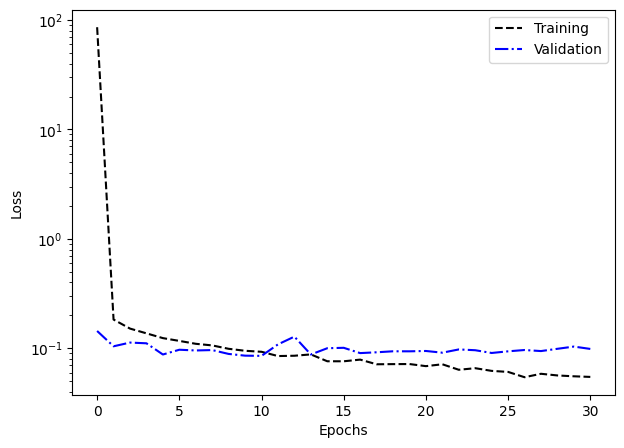

time: 366 ms (started: 2023-07-12 09:19:12 +02:00)


In [158]:
hist = pd.DataFrame(history.history)
hist["epoch"] = history.epoch

# # Plotting the results:
# # Remember that we defined our loss as MSE in the model.
plot_learning_curves(hist, "Learning curve normalized, two outputs", True)

In [159]:
y_predicted_wo_gp_extra = model_best.predict(X_test_wo_gp)
print(y_predicted_wo_gp_extra.shape)
print(y_test.shape)

y_test = np.array(y_test)

5/5 [==============================] - 0s 34ms/step
(148, 20)
(148, 20)
time: 740 ms (started: 2023-07-12 09:19:13 +02:00)


In [160]:
y_predicted_wo_gp_extra_backTrafo = sY.inverse_transform(y_predicted_wo_gp_extra)
y_test_backTrafo = sY.inverse_transform(y_test)

time: 1.29 ms (started: 2023-07-12 09:19:13 +02:00)


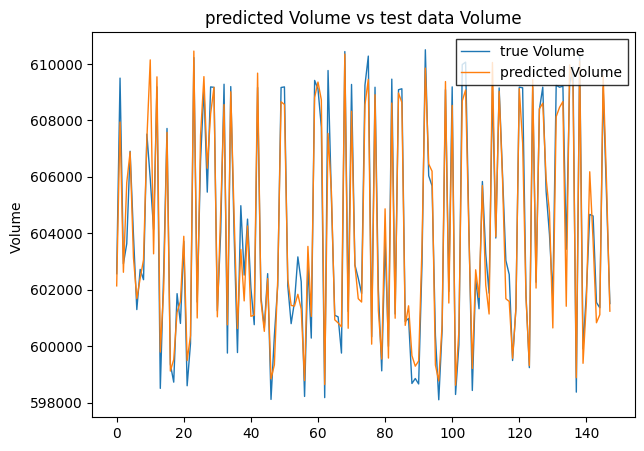

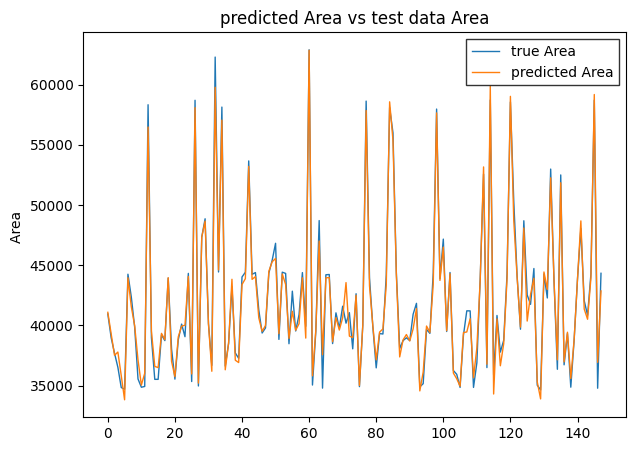

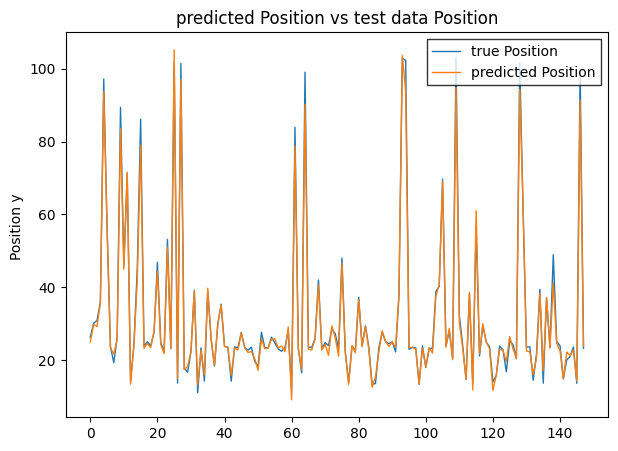

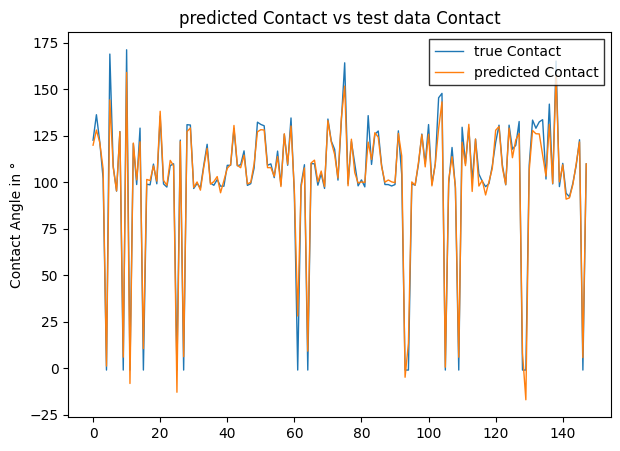

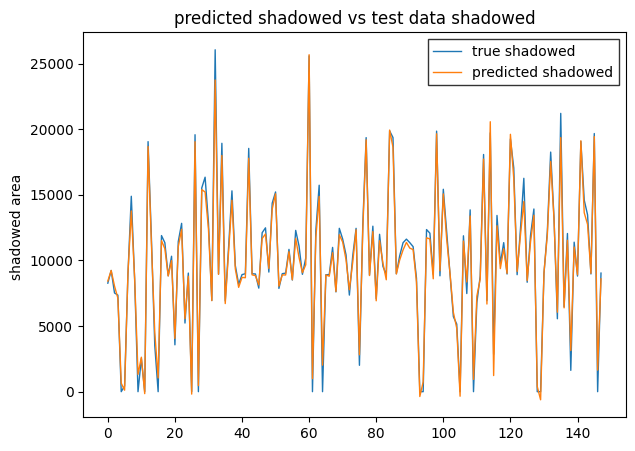

...

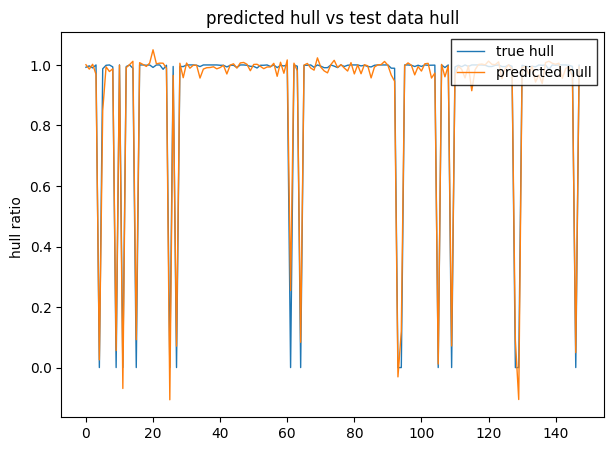

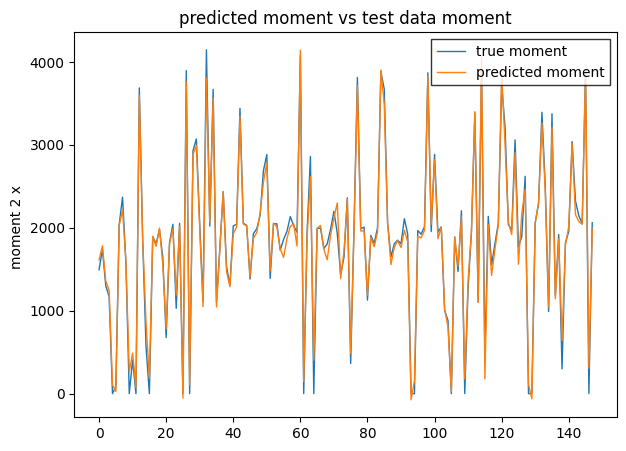

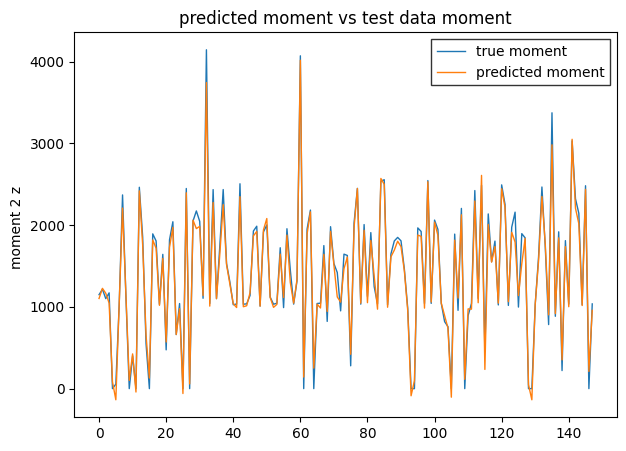

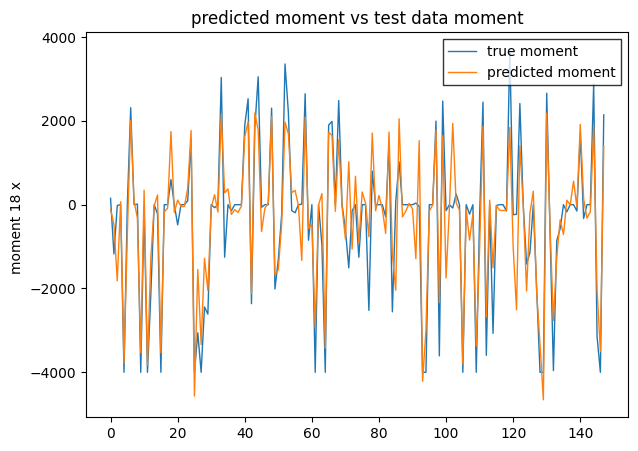

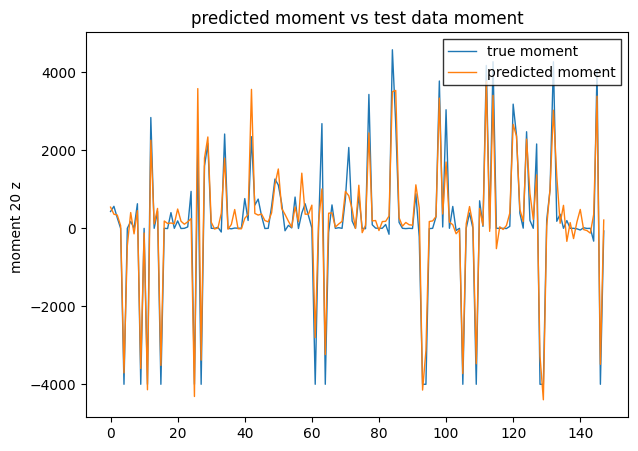

time: 5.14 s (started: 2023-07-12 09:19:13 +02:00)


In [161]:
# compare back-transformed predicted data with back-transformed original data

#Plotting Volume Prediction
plotting(y_test_backTrafo[:,0], y_predicted_wo_gp_extra_backTrafo[:,0], 'Volume ', True)

#Plotting Area Prediction
plotting(y_test_backTrafo[:,1], y_predicted_wo_gp_extra_backTrafo[:,1], 'Area ', True)

#Plotting Centroid y Prediction
plotting(y_test_backTrafo[:,2], y_predicted_wo_gp_extra_backTrafo[:,2], 'Position y ', True)

#Plotting Contact Angle Prediction
plotting(y_test_backTrafo[:,3], y_predicted_wo_gp_extra_backTrafo[:,3],'Contact Angle in °', True)

#Plotting shadowed area
plotting(y_test_backTrafo[:,4], y_predicted_wo_gp_extra_backTrafo[:,4], 'shadowed area ', True)

#Plotting perimeter
plotting(y_test_backTrafo[:,5], y_predicted_wo_gp_extra_backTrafo[:,5], 'perimeter ', True)

#Plotting perimeter
plotting(y_test_backTrafo[:,6], y_predicted_wo_gp_extra_backTrafo[:,6], 'compactness ', True)

#Plotting w
plotting(y_test_backTrafo[:,7], y_predicted_wo_gp_extra_backTrafo[:,7], 'w ', True)

#Plotting skewness
plotting(y_test_backTrafo[:,8], y_predicted_wo_gp_extra_backTrafo[:,8], 'skewness ', True)

#Plotting kurtosis
plotting(y_test_backTrafo[:,9], y_predicted_wo_gp_extra_backTrafo[:,9], 'kurtosis ', True)

#Plotting max pit height
plotting(y_test_backTrafo[:,10], y_predicted_wo_gp_extra_backTrafo[:,10], 'max pit height ', True)

#Plotting max peak height
plotting(y_test_backTrafo[:,11], y_predicted_wo_gp_extra_backTrafo[:,11], 'max peak height ', True)

#Plotting aspect ratio
plotting(y_test_backTrafo[:,12], y_predicted_wo_gp_extra_backTrafo[:,12], 'aspect ratio', True)

#Plotting theta
plotting(y_test_backTrafo[:,13], y_predicted_wo_gp_extra_backTrafo[:,13], 'theta ', True)

#Plotting point aspect ratio
plotting(y_test_backTrafo[:,14], y_predicted_wo_gp_extra_backTrafo[:,14], 'point aspect ratio', True)

#Plotting hull ratio
plotting(y_test_backTrafo[:,15], y_predicted_wo_gp_extra_backTrafo[:,15], 'hull ratio ', True)

#Plotting moment 2 x
plotting(y_test_backTrafo[:,16], y_predicted_wo_gp_extra_backTrafo[:,16], 'moment 2 x ', True)

#Plotting moment 2 z
plotting(y_test_backTrafo[:,17], y_predicted_wo_gp_extra_backTrafo[:,17], 'moment 2 z ', True)

#Plotting moment 17 x
plotting(y_test_backTrafo[:,18], y_predicted_wo_gp_extra_backTrafo[:,18], 'moment 18 x ', True)

#Plotting moment 19 z
plotting(y_test_backTrafo[:,19], y_predicted_wo_gp_extra_backTrafo[:,19], 'moment 20 z ', True)

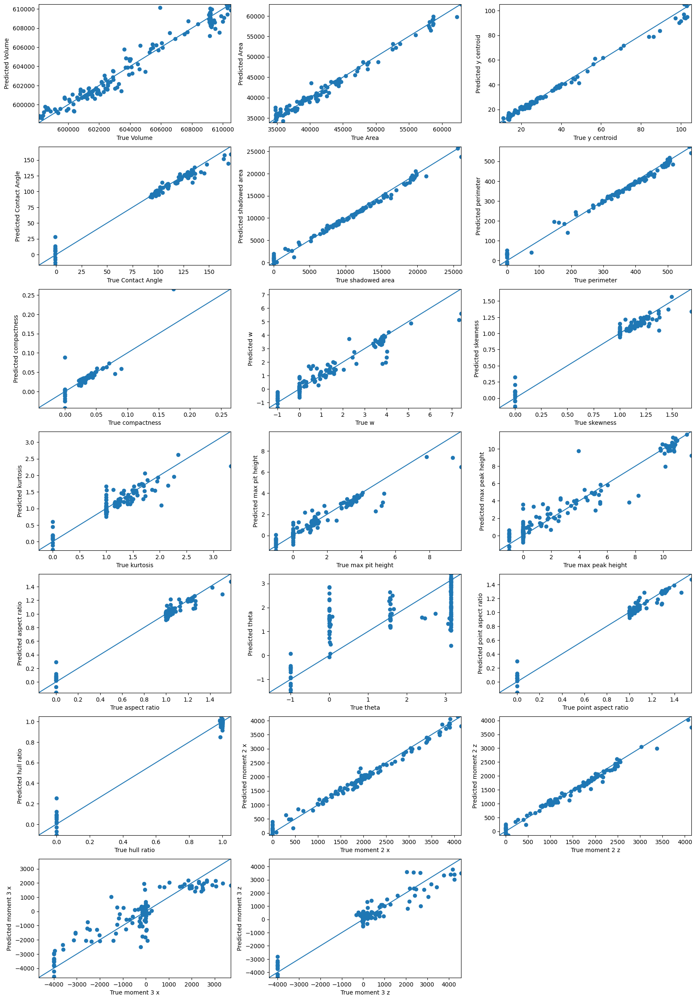

time: 2.53 s (started: 2023-07-12 09:19:19 +02:00)


In [162]:
visualize_accuracy(y_predicted_wo_gp_extra_backTrafo,y_test_backTrafo)

In [163]:
data = []
for i in range (len(y_test_backTrafo[0])):
    score = r2_score(y_test_backTrafo[:,i], y_predicted_wo_gp_extra_backTrafo[:,i])
    mae = mean_absolute_error(y_test_backTrafo[:,i], y_predicted_wo_gp_extra_backTrafo[:,i])
    mse = mean_squared_error(y_test_backTrafo[:,i], y_predicted_wo_gp_extra_backTrafo[:,i])
    data.append([score, mae, mse])
column_labels= ['Volume', 'Area' , 'y centroid','Contact Angle', 'shadowed area' , 'perimeter','compactness', 'w', 'skewness', 'kurtosis', 'max pit height', 'max peak height',
                'aspect ratio', 'theta', 'point aspect ratio', 'hull ratio', 'moment 2 x', 'moment 2 z', 'moment 3 x', 'moment 3 z']
temp = pd.DataFrame(np.array(data).T,columns=column_labels)
temp.index = ["R²", "MAE", "MSE"]
score_df[['Volume', 'Area', 'y centroid' , 'Contact Angle', 'shadowed area' , 'perimeter','compactness', 'w', 'skewness', 'kurtosis', 'max pit height', 'max peak height',
          'aspect ratio', 'theta', 'point aspect ratio', 'hull ratio', 'moment 2 x', 'moment 2 z', 'moment 3 x', 'moment 3 z']] = temp

time: 15.4 ms (started: 2023-07-12 09:19:21 +02:00)


In [164]:
wo_gp_extra_score_df = score_df.copy()
wo_gp_extra_score_df.loc["R²"] = score_df.loc["R²"].apply(lambda x : f"{x*100:.2f}%")
wo_gp_extra_score_df.loc["MAE"] = score_df.loc["MAE"].apply(lambda x : f"{x:.2f}")
wo_gp_extra_score_df.loc["MSE"] = score_df.loc["MSE"].apply(lambda x : f"{x:.2f}")

time: 19.5 ms (started: 2023-07-12 09:19:21 +02:00)


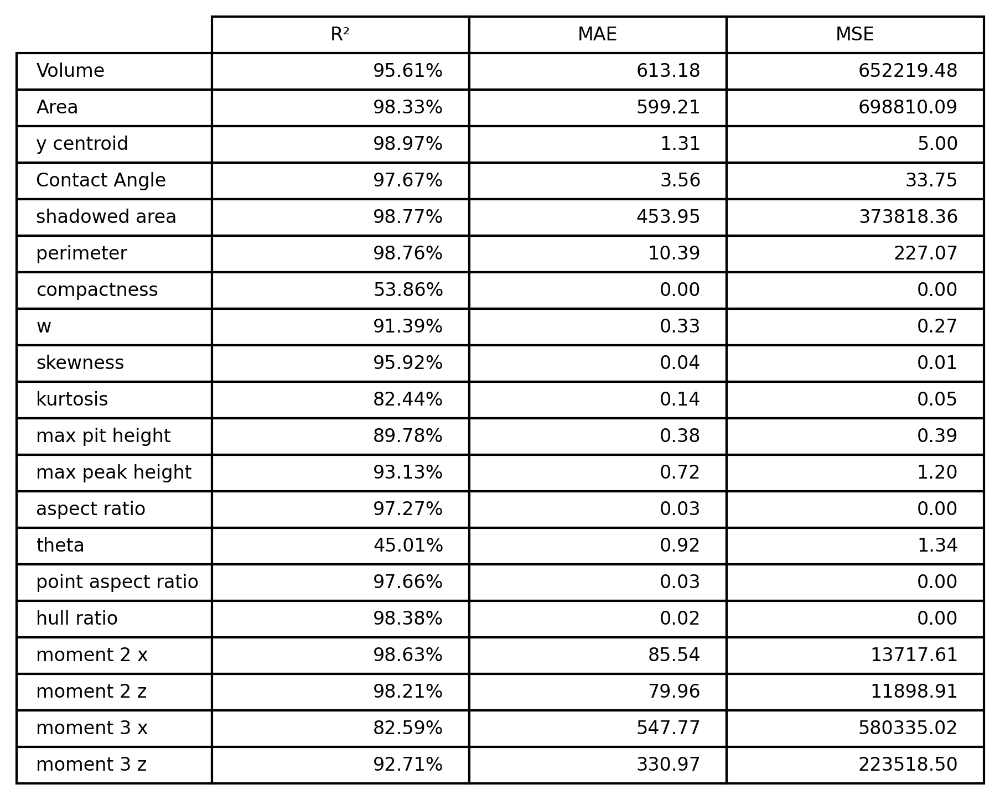

time: 518 ms (started: 2023-07-12 09:19:21 +02:00)


In [165]:
print_stats(wo_gp_extra_score_df)

## 8.0 Comparison of models with and without glarepoints 

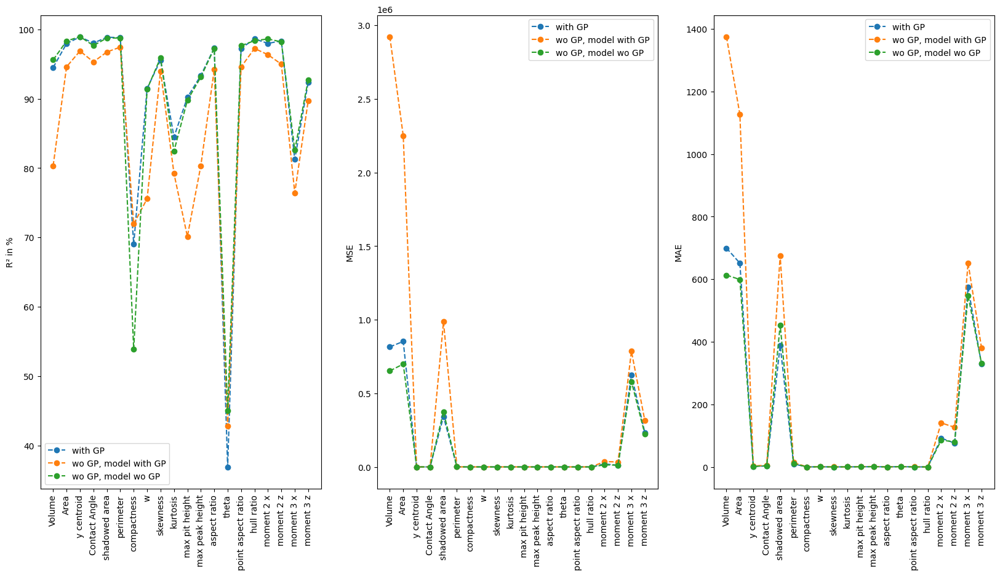

time: 736 ms (started: 2023-07-12 09:19:22 +02:00)


In [166]:
compare_stats(with_gp_score_df,wo_gp_score_df, wo_gp_extra_score_df,["with GP", "wo GP, model with GP", "wo GP, model wo GP"] )

After several runs we found the model which was trained on the images with glarepoints and then tested without glarepoints to perform worst. The other two models were performing similarly, 
sometimes the model trained and tested with glarepoints sometimes the model trained and tested without glarepoints performed better. Probably this is caused by the random weight initialization during the training. Therefore the training of the models appears to be more crucial than the fact whether it is trained with or without glarepoint data. 